In [1]:
import time

t0 = time.time()
x = -1
n_iters = int(1e6)
for i in range(n_iters):
    x = i
print("%.1e iterations took %.3f sec" % (n_iters, time.time() - t0))

1.0e+06 iterations took 0.087 sec


In [2]:
import time

lst = range(int(134))
t0 = time.time()
print int(1e9) in lst
print("Took %.3f sec" % (time.time() - t0))

False
Took 0.000 sec


# Jointplot of model predictions vs. true values for validation set
First cell is for sequential models. Second cell is for functional models.

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
import numpy as np
import pandas as pd
from plot_functions import jointplot
import os

sharprLfcPath = os.environ.get("OAKMPRA") + '/sharpr/data/processed_data/sharprFullDataMatrixLfcPooled.tsv'
sharprLfcs = pd.read_csv(sharprLfcPath,
                         delimiter = '\t',
                         header = 0).values

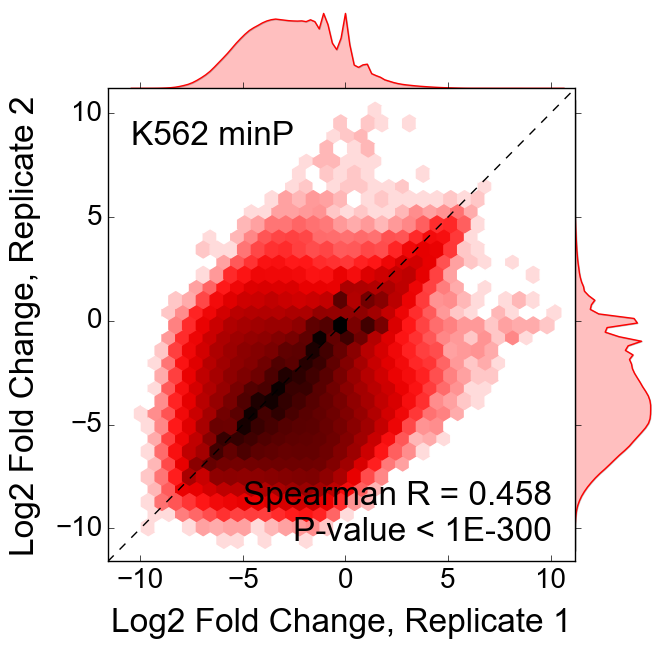

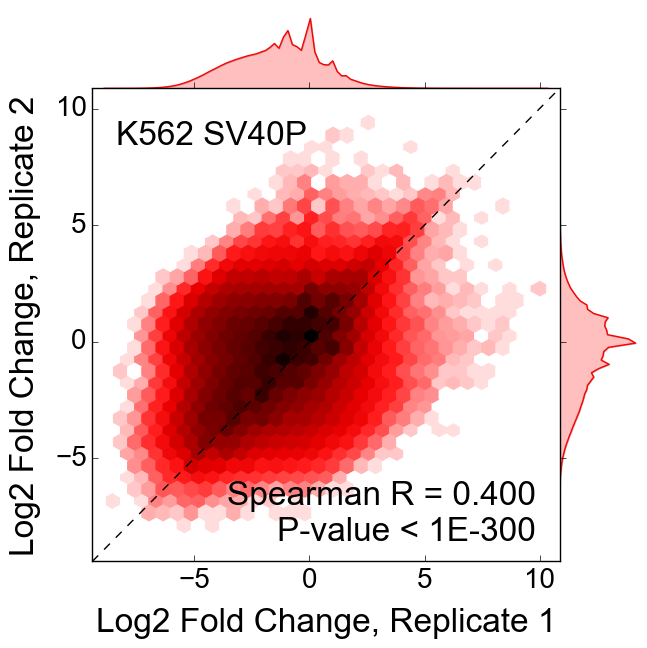

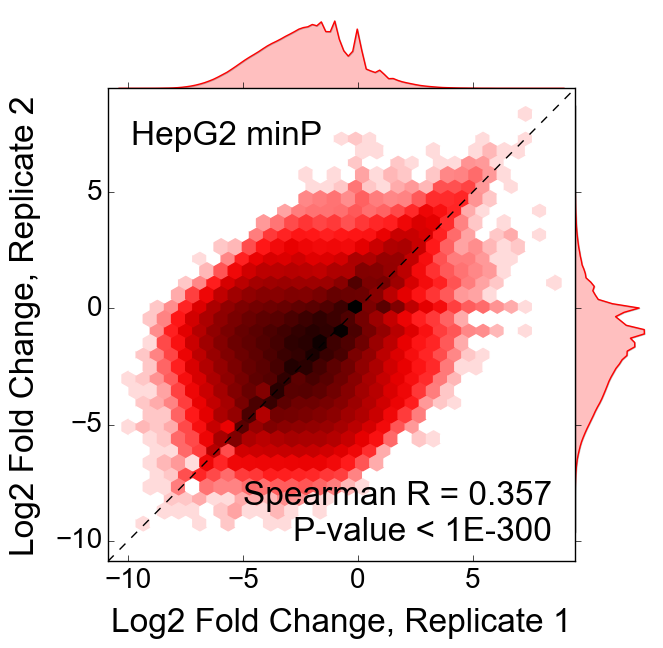

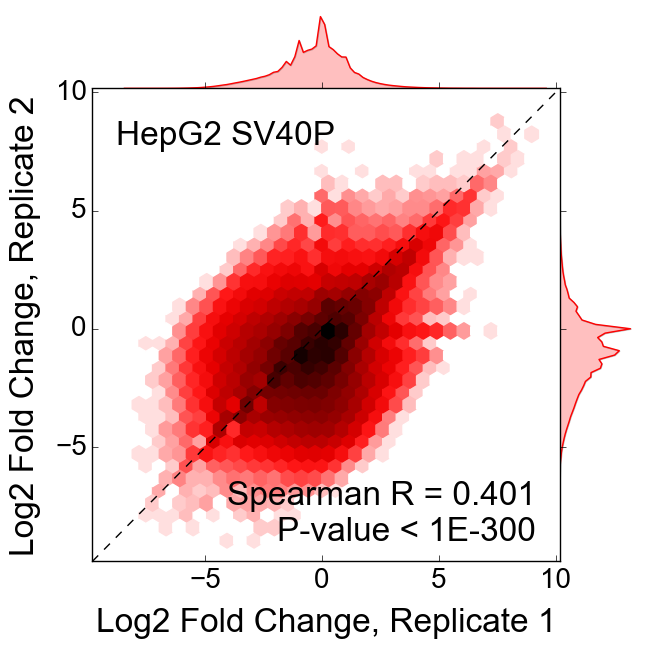

In [20]:
tasks = ['K562 minP', 'K562 SV40P', 'HepG2 minP', 'HepG2 SV40P']
for (i, task) in enumerate(tasks):
    jointplot(vals1 = sharprLfcs[:, 19 + 3*i], 
              vals2 = sharprLfcs[:, 20 + 3*i],
              out_pdf = ("../plots/sharpr_scatterplots/finalFigurePlots/"
                          "sharpr_lfcs_71818_replicatecorrs_hex_relabeled_%s.png" % task.strip('\s').lower()),
              show = True,
              cor = 'spearmanr',
              square = True,
              despine = False,
              x_label = "Log2 Fold Change, Replicate 1",
              y_label = "Log2 Fold Change, Replicate 2",
              figsize = 6,
              ratio = 6,
              dpi = 500,
              color = '#ff0000',
              kde = True,
              bw = 'scott',
              hexbin = True,
              bincount = 30,
              flipAnnotations = True,
              annot = task,
              axfont = 24,
              tickfont = 20
             )
    
#     jointplot(vals1 = sharprLfcs[:, 19 + 3*i], 
#               vals2 = sharprLfcs[:, 20 + 3*i],
#               out_pdf = ("../plots/sharpr_scatterplots/experimentalData/"
#                           "sharpr_lfcs_71718_replicatecorrs_scatter_%s.png" % task.strip().lower()),
#               show = True,
#               cor = 'spearmanr',
#               square = True,
#               despine = False,
#               x_label = "Log2 Fold Change, %s Replicate 1" % task,
#               y_label = "Log2 Fold Change, %s Replicate 2" % task,
#               figsize = 6,
#               ratio = 6,
#               dpi = 500,
#               color = 'red',
#               kde = True,
#               bw = 'scott',
#               hexbin = False
#              )

In [6]:
import deeplift.conversion.keras_conversion as kc
import numpy as np
import sys
import h5py

plotModelName = "record_13_model_bgGhy_"
plotModelJson = "../model_files/sharpr_znormed_jul23/" + plotModelName + "modelJson.json"
plotModelWeights = "../model_files/sharpr_znormed_jul23/" + plotModelName + "modelWeights.h5"
plotModel = kc.load_keras_model(plotModelWeights, json=plotModelJson)

valDataPath = "../hdf5files/sharpr_znormed_jul23/valid_data.hdf5"
testDataPath = "../hdf5files/sharpr_znormed_jul23/test_data.hdf5"
valData = h5py.File(valDataPath)
testData = h5py.File(testDataPath)
print(valData['X/sequence'].shape)
print(testData['X/sequence'].shape)
valPreds = plotModel.predict(valData['X/sequence'], batch_size = 500)
testPreds = plotModel.predict(testData['X/sequence'], batch_size = 500)

/home/users/rmovva/anaconda2/envs/mommadragonn/lib/python2.7/site-packages/theano/gpuarray/dnn.py:135: UserWarning: Your cuDNN version is more recent than Theano. If you encounter problems, try updating Theano or downgrading cuDNN to version 5.1.
  warnings.warn("Your cuDNN version is more recent than "
Using cuDNN version 6020 on context None
Mapped name None to device cuda: TITAN Xp (0000:02:00.0)
Using Theano backend.


(19833, 145, 4)
(10130, 145, 4)


On task K562 minP
On val set
Using 19074 / 19833 of datapoints


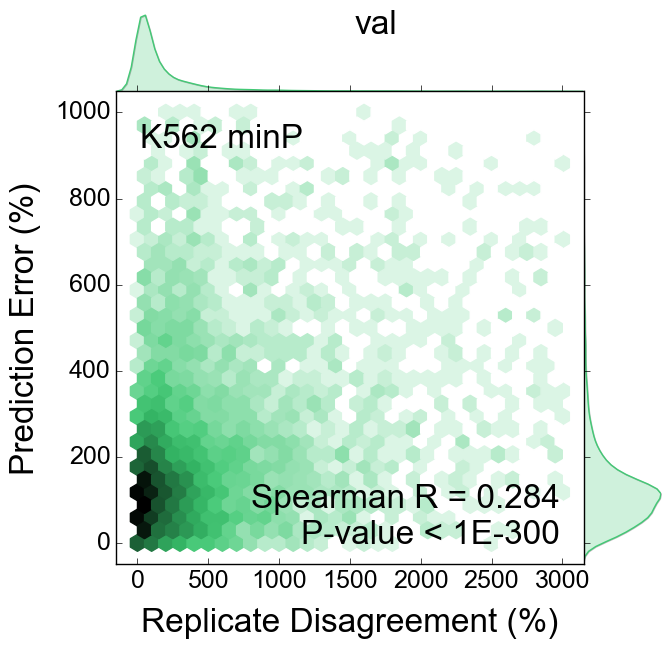

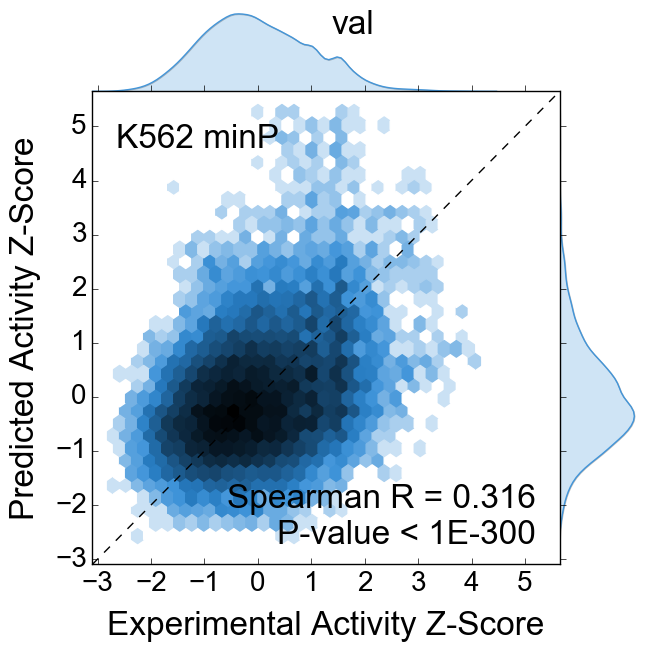

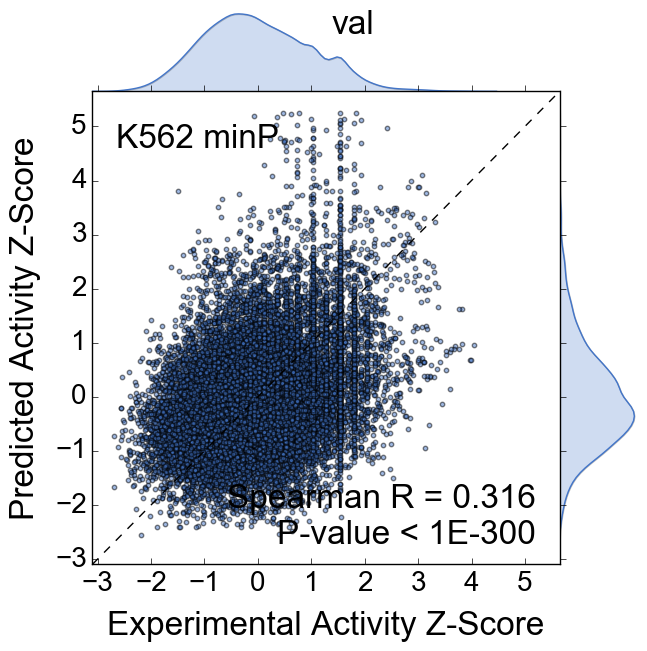

On test set
Using 9709 / 10130 of datapoints


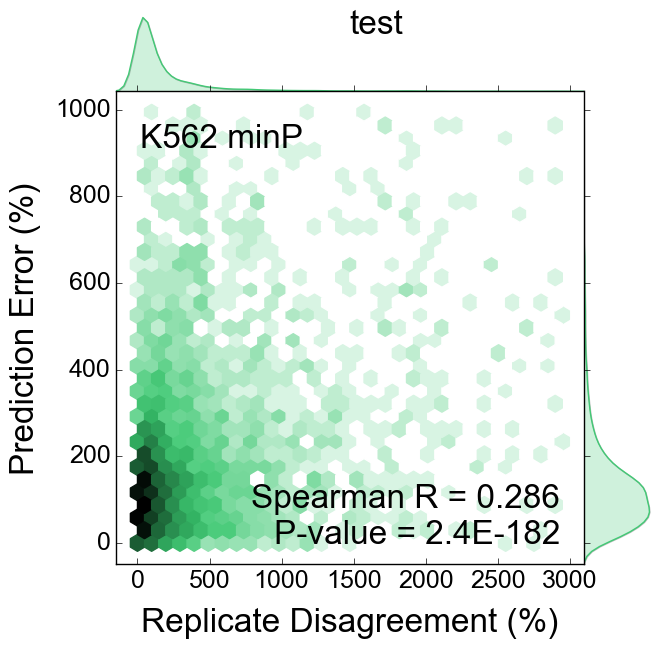

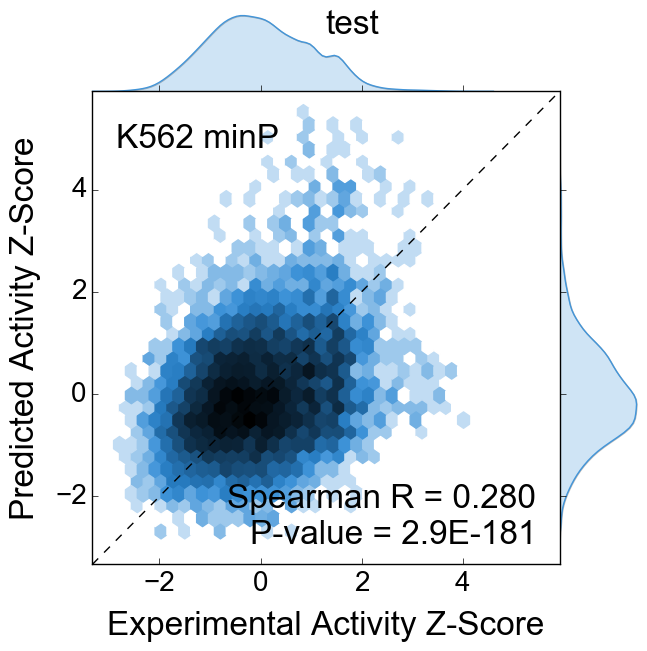

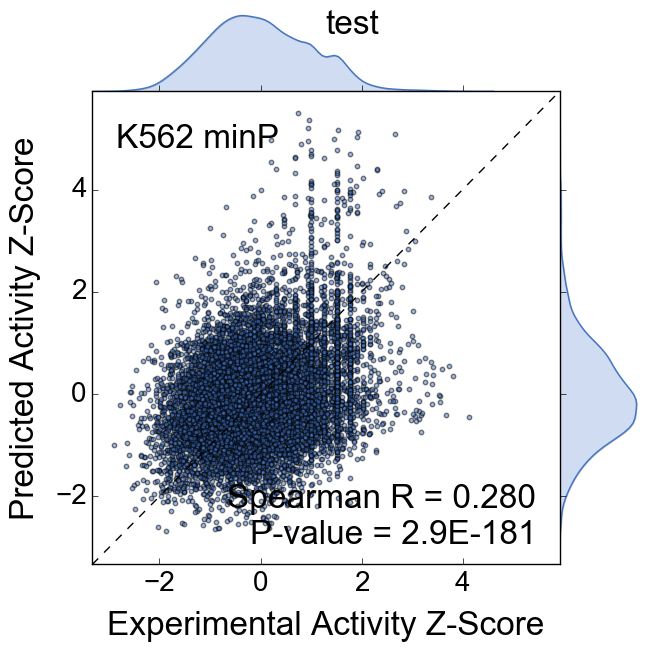

On task K562 SV40P
On val set
Using 19307 / 19833 of datapoints


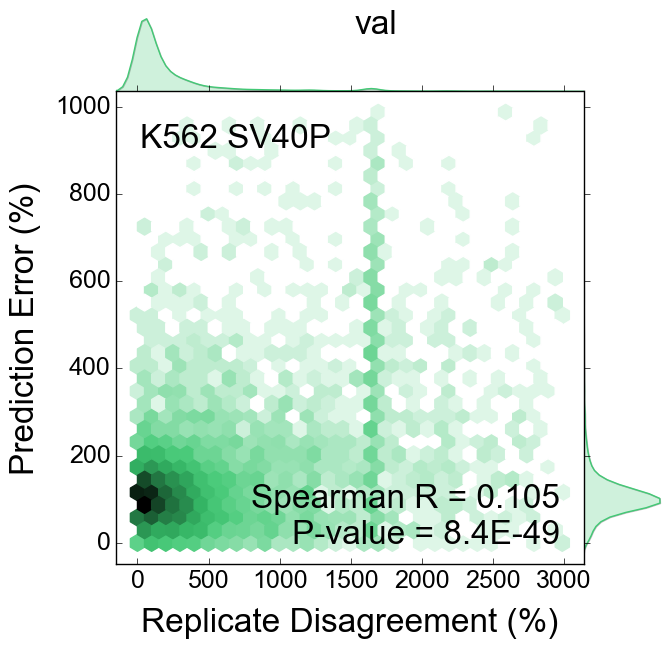

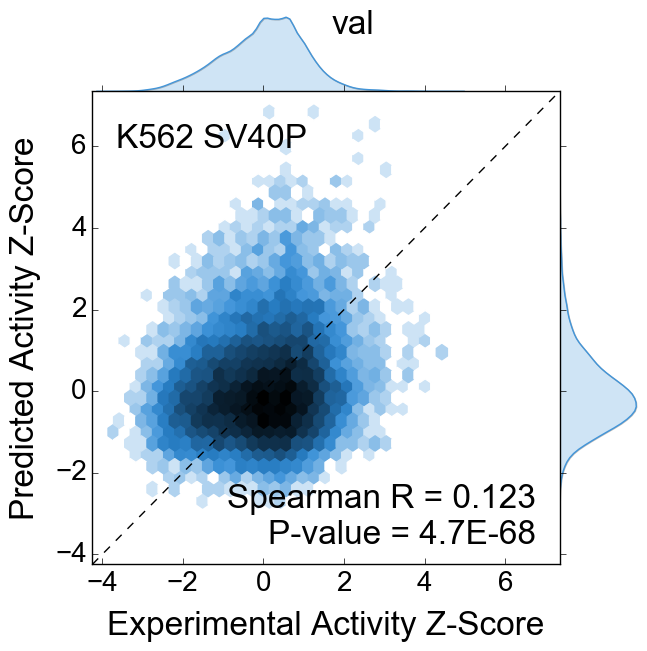

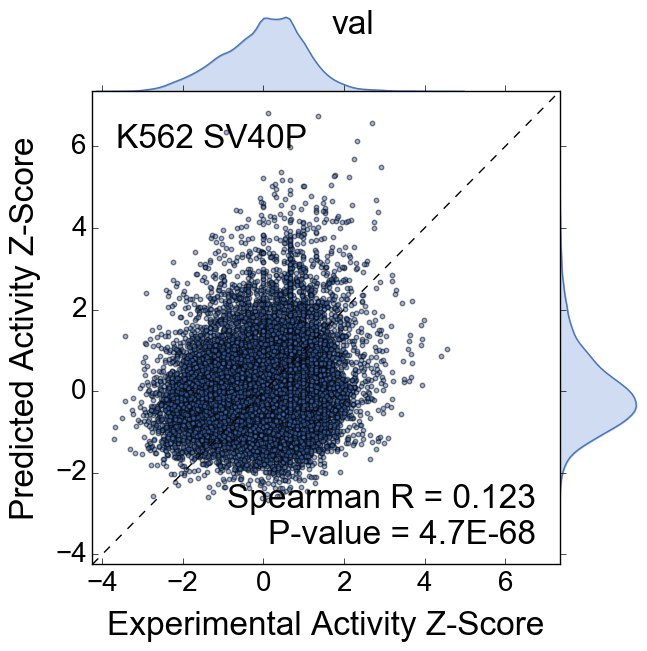

On test set
Using 9859 / 10130 of datapoints


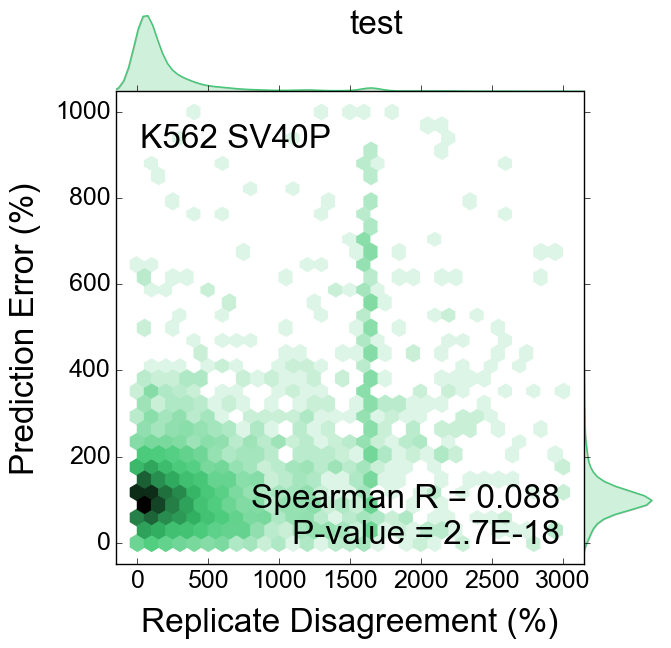

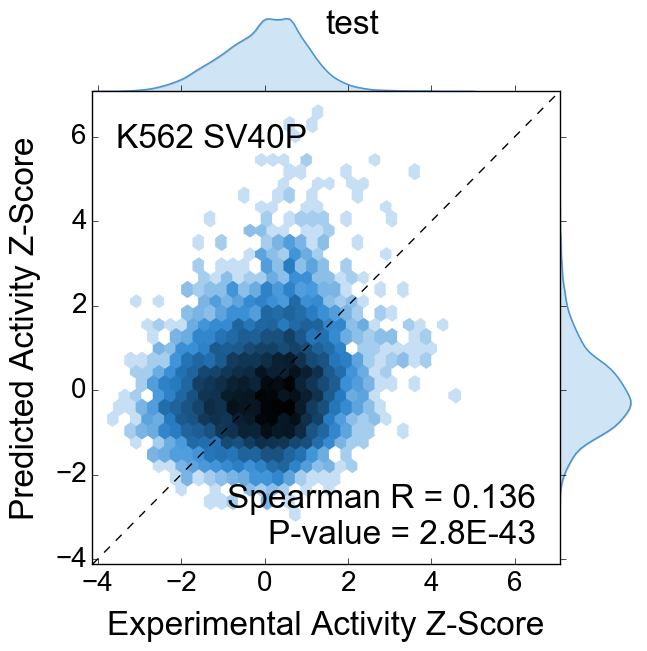

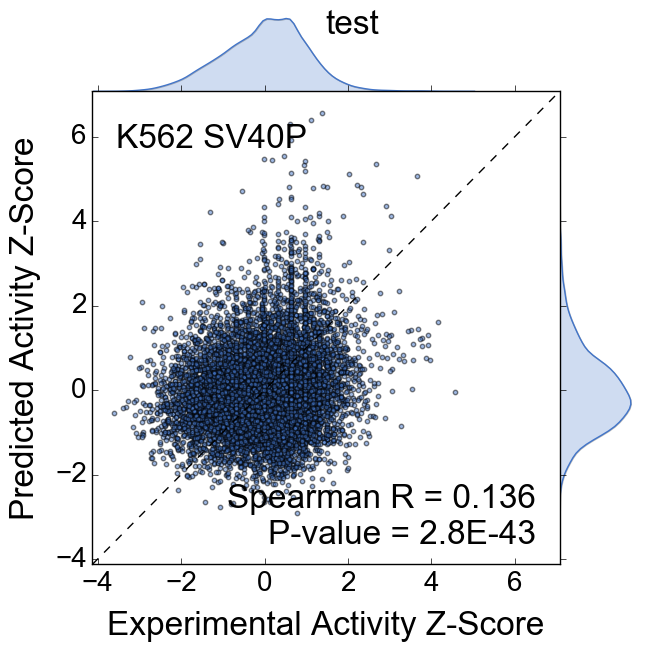

On task HepG2 minP
On val set
Using 19260 / 19833 of datapoints


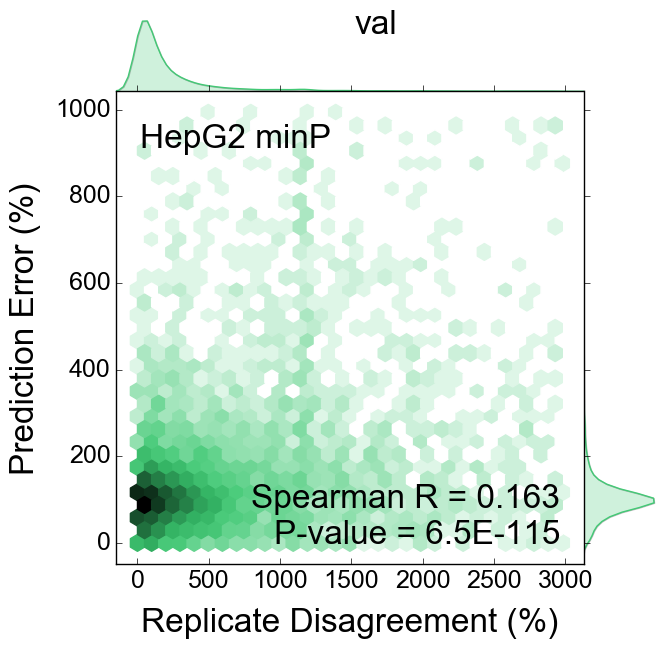

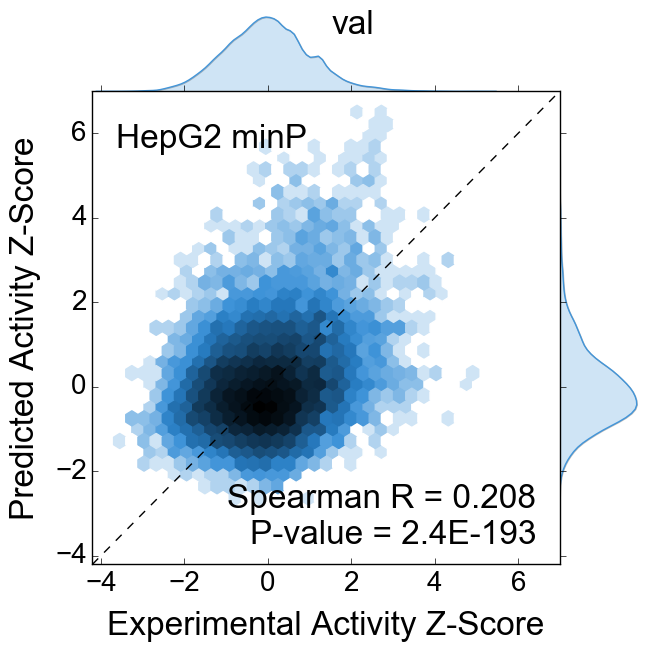

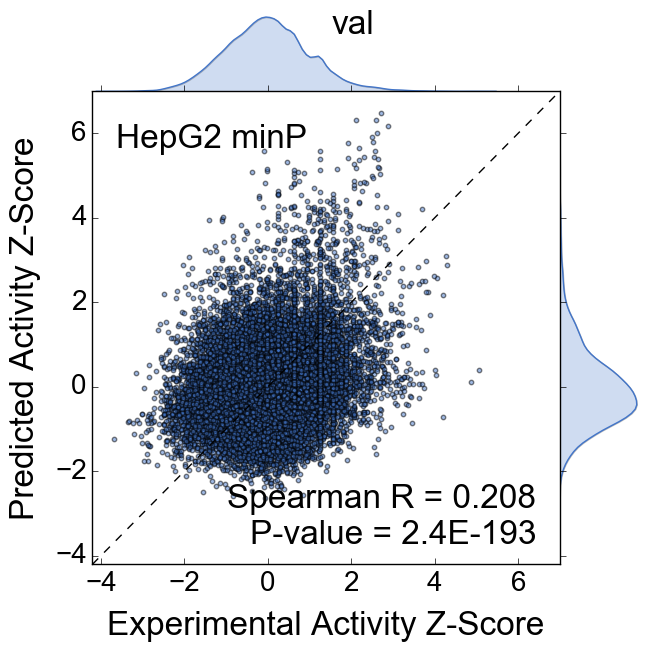

On test set
Using 9826 / 10130 of datapoints


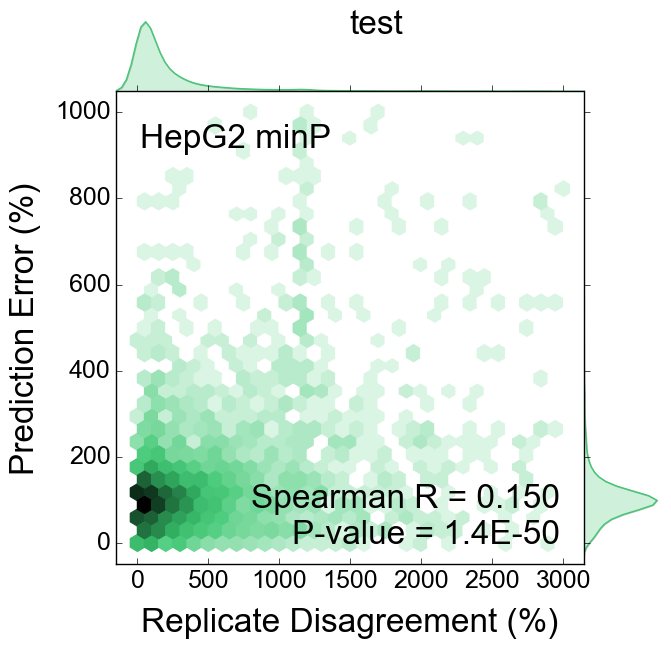

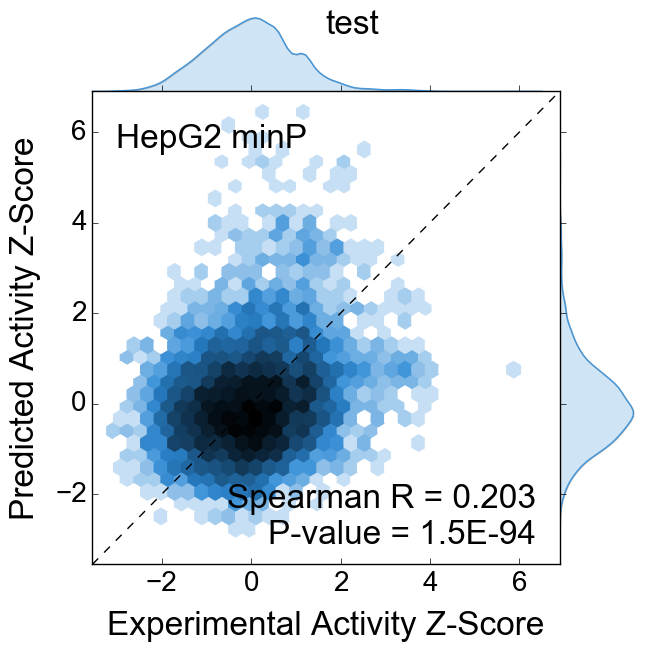

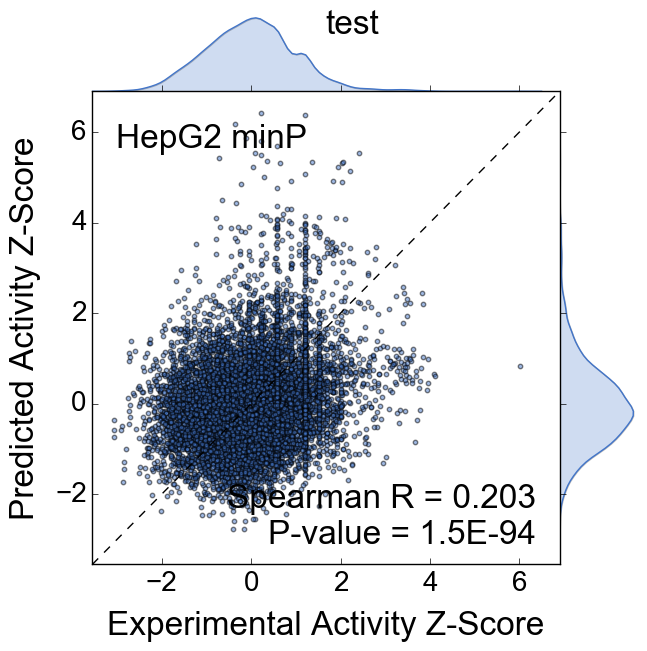

On task HepG2 SV40P
On val set
Using 19245 / 19833 of datapoints


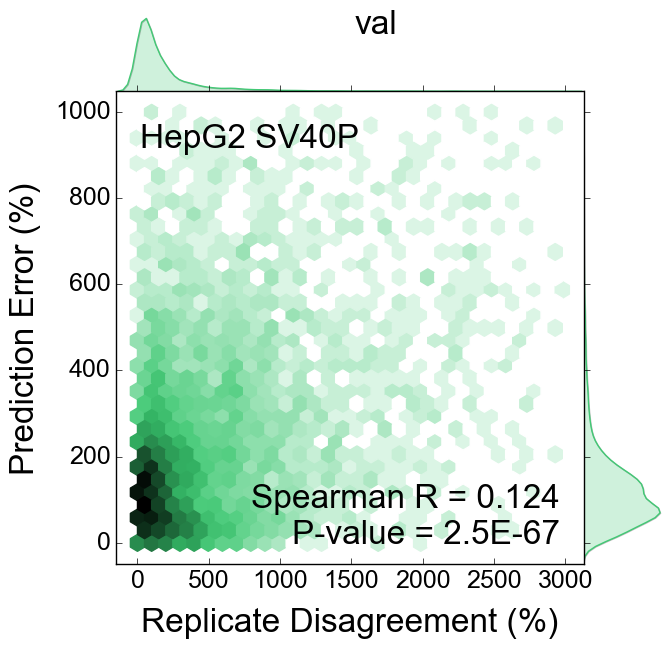

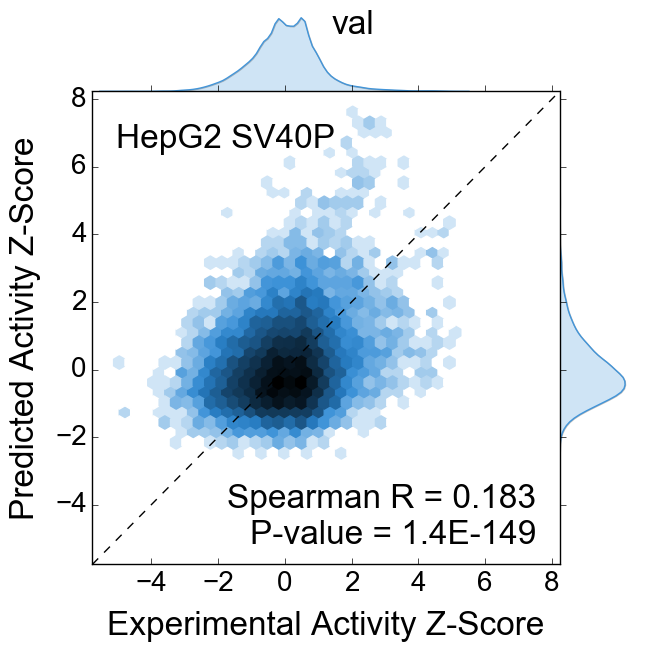

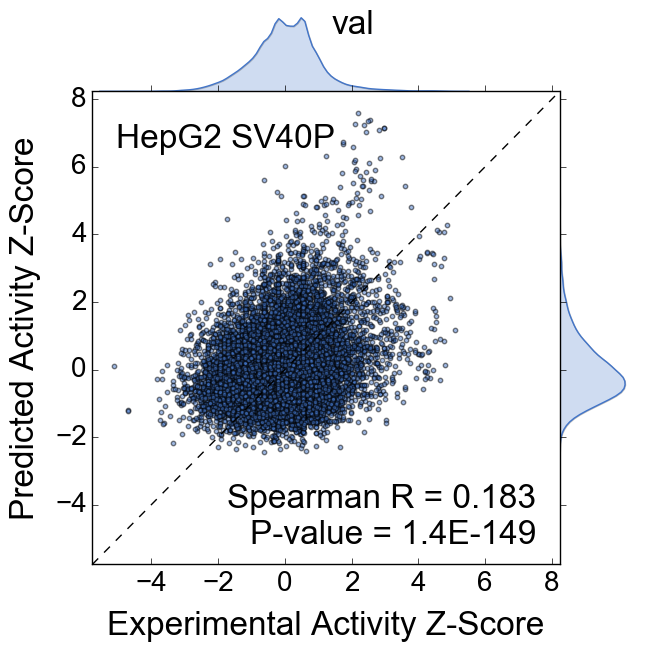

On test set
Using 9837 / 10130 of datapoints


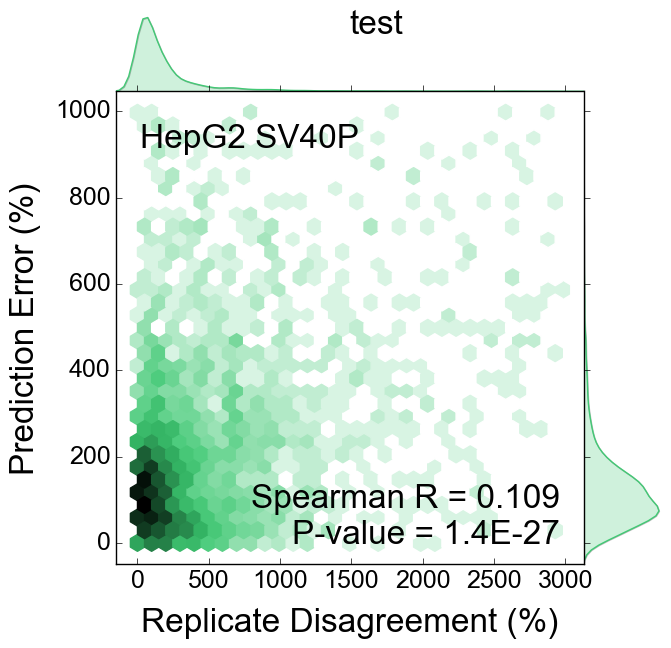

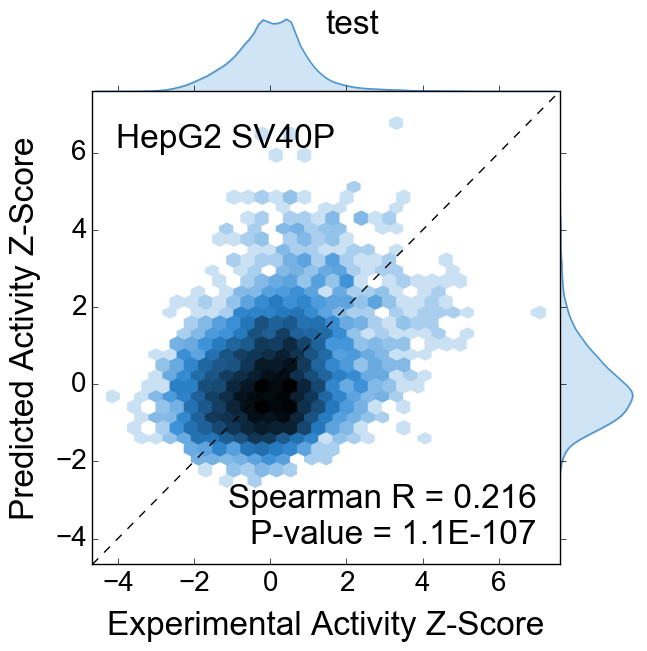

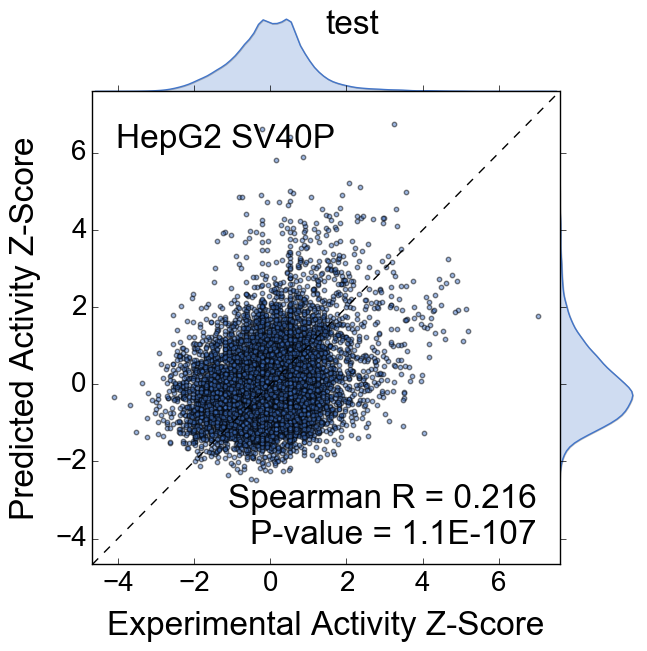

In [22]:
import scipy.stats as sp

for (i, task) in enumerate(tasks):
    print("On task %s" % task)
    task_idx = 3*i + 2
    
    for predSet in ['val', 'test']:
        print("On %s set" % predSet)
        
        if predSet == 'val':
            experimental = np.squeeze(valData['Y/output'][:, task_idx])
            predicted = np.squeeze(valPreds[:, task_idx])
            rep1 = np.squeeze(valData['Y/output'][:, 3*i])
            rep2 = np.squeeze(valData['Y/output'][:, 3*i + 1])
            
        if predSet == 'test':
            experimental = np.squeeze(testData['Y/output'][:, task_idx])
            predicted = np.squeeze(testPreds[:, task_idx])
            rep1 = np.squeeze(testData['Y/output'][:, 3*i])
            rep2 = np.squeeze(testData['Y/output'][:, 3*i + 1])

        # quality vs. accuracy analysis (supp. fig.)
        # normalize difference in replicate values
        percentRepDifference = 100.0*np.abs((rep1 - rep2) / experimental)
        percentError = 100.0*np.abs((predicted - experimental) / experimental)
        # ignore extreme values that distort the plot
#         bound = np.ones(len(repDifference), dtype = bool)
        bound = np.logical_and(percentRepDifference < 3000, percentError < 1000)
        print("Using %d / %d of datapoints" % (np.sum(bound), len(experimental)))
        jointplot(vals1 = percentRepDifference[bound], 
                  vals2 = percentError[bound],
                  out_pdf = ("../plots/sharpr_scatterplots/finalFigurePlots/"
                              "qualityVsAccuracy_difffromavg_%sset_71818_hex_relabeled_%s.png" 
                             % (predSet, task.strip().lower())),
                  show = True,
                  cor = 'spearmanr',
                  despine = False,
                  x_label = "Replicate Disagreement (%)",
                  y_label = "Prediction Error (%)",
                  figsize = 6,
                  ratio = 6,
                  dpi = 500,
                  color = '#42C975',
                  kde = True,
                  bw = 'scott',
                  hexbin = True,
                  bincount = 30,
                  title = predSet,
                  flipAnnotations = True,
                  annot = task,
                  axfont = 24,
                  tickfont = 18
                 )

        jointplot(vals1 = sp.zscore(experimental), 
                  vals2 = sp.zscore(predicted),
                  out_pdf = ("../plots/sharpr_scatterplots/finalFigurePlots/"
                              "predperformance_%sset_71818_hex_relabeled_%s.png" % (predSet, task.strip().lower())),
                  show = True,
                  cor = 'spearmanr',
                  square = True,
                  despine = False,
                  x_label = "Experimental Activity Z-Score",
                  y_label = "Predicted Activity Z-Score",
                  figsize = 6,
                  ratio = 6,
                  dpi = 500,
                  color = '#4295D9',
                  kde = True,
                  bw = 'scott',
                  hexbin = True,
                  bincount = 30,
                  title = predSet,
                  flipAnnotations = True,
                  annot = task,
                  axfont = 24,
                  tickfont = 20
                 )

        jointplot(vals1 = sp.zscore(experimental), 
                  vals2 = sp.zscore(predicted),
                  out_pdf = ("../plots/sharpr_scatterplots/finalFigurePlots/"
                              "predperformance_%sset71818_scatter_relabeled_%s.png" % (predSet, task.strip().lower())),
                  show = True,
                  cor = 'spearmanr',
                  square = True,
                  despine = False,
                  x_label = "Experimental Activity Z-Score",
                  y_label = "Predicted Activity Z-Score",
                  figsize = 6,
                  ratio = 6,
                  dpi = 500,
                  color = '#4275C9',
                  kde = True,
                  bw = 'scott',
                  hexbin = False,
                  title = predSet,
                  flipAnnotations = True,
                  annot = task,
                  axfont = 24,
                  tickfont = 20
                 )

In [7]:
np.mean(preds[2][:, 0])

-39.70113

-0.652793 0.176758
-0.000509245 1.00079


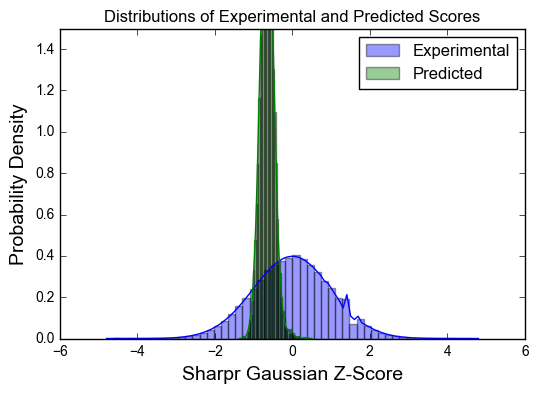

In [17]:
# Visualize distributions of predictions and labels

f1 = h5py.File("../hdf5files/gaussianprojection_sequential_aug9/train_data.hdf5")
f2 = h5py.File("../hdf5files/sharpr_znormed_jul23/train_data.hdf5")
f3 = h5py.File("../hdf5files/sharpr_lfcpooled_jul23/train_data.hdf5")

print np.mean(preds[2]), np.std(preds[2])
print np.mean(f1['Y/output'][:, 2]), np.std(f1['Y/output'][:, 2])
# print np.mean(f2['Y/output'][:, 0]), np.std(f2['Y/output'][:, 0])
# print np.mean(f3['Y/output'][:, 0]), np.std(f3['Y/output'][:, 0])

import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots()

sns.distplot(f1['Y/output'][:, 2], label = 'Experimental', ax = ax)
sns.distplot(preds[2], label = 'Predicted', ax = ax)
ax.set_ylim([None, 1.5])
plt.xlabel('Sharpr Gaussian Z-Score', fontsize = 14)
plt.ylabel('Probability Density', fontsize = 14)
plt.title('Distributions of Experimental and Predicted Scores')
plt.legend()
plt.show()
plt.savefig('../plots/sharpr_scatterplots/experimentalData/%sexperimental_predicted_scoredistributions.png' % plotModelName)
# sns.distplot(f2['Y/output'][:, 0])
# plt.show()
# sns.distplot(f3['Y/output'][:, 0])
# plt.show()

# sns.kdeplot(f1['Y/output'][:, 0])
# plt.show()
# sns.kdeplot(f2['Y/output'][:, 0])
# plt.show()
# sns.kdeplot(f3['Y/output'][:, 0])
# plt.show()

# Prediction performance by chromatin state

In [18]:
import deeplift.conversion.keras_conversion as kc
import numpy as np
import sys

modelName = "record_13_model_bgGhy_"
modelJson = "../model_files/sharpr_znormed_jul23/" + plotModelName + "modelJson.json"
modelWeights = "../model_files/sharpr_znormed_jul23/" + plotModelName + "modelWeights.h5"

model = kc.load_keras_model(modelWeights, json=modelJson)

import h5py
val_data = h5py.File("../hdf5files/sharpr_znormed_jul23/valid_data.hdf5")
test_data = h5py.File("../hdf5files/sharpr_znormed_jul23/test_data.hdf5")
X_valtest = np.concatenate((val_data['X/sequence'], test_data['X/sequence']))
y_valtest = np.concatenate((val_data['Y/output'], test_data['Y/output']))
print X_valtest.shape, y_valtest.shape
preds = model.predict(X_valtest, batch_size = 500)
print preds.shape

(29963, 145, 4) (29963, 12)
(29963, 12)


In [12]:
import gzip

fragmentNames = (gzip.open('../splits/sharpr_znormed_jul23/val_split.txt.gz').readlines() + 
                 gzip.open('../splits/sharpr_znormed_jul23/test_split.txt.gz').readlines())

fragmentNames = [s.strip() for s in fragmentNames]
print fragmentNames[:3], fragmentNames[-3:]

['H1hesc_1_6_0_chr8_128830575_n', 'H1hesc_1_6_1_chr8_128830575_n', 'H1hesc_1_6_2_chr8_128830575_n'] ['Huvec_23_30_28_chr18_77772955_n', 'Huvec_23_30_29_chr18_77772955_n', 'Huvec_23_30_30_chr18_77772955_n']


In [16]:
chromStateFragments = {}

with open('../splits/sharpr_znormed_jul23/valtest_regions_chromhmm_annotated_sep24.bed') as f:
    for line in f:
        line = line.strip().split('\t')
        fragment = line[3]
        state = line[9]
        if state not in chromStateFragments:
            chromStateFragments[state] = []
        chromStateFragments[state].append(fragmentNames.index(fragment))
        
for state in chromStateFragments:
    chromStateFragments[state] = np.array(chromStateFragments[state])

In [22]:
# print {state: len(chromStateFragments[state]) for state in chromStateFragments}

import scipy.stats as sp

print sp.spearmanr(y_valtest[:, 0], y_valtest[:, 1])
print sp.spearmanr(preds[:, 2], y_valtest[:, 2])

for state in chromStateFragments:
    print state
    print len(chromStateFragments[state])
    print sp.spearmanr(y_valtest[chromStateFragments[state], 0], y_valtest[chromStateFragments[state], 1])
    print sp.spearmanr(preds[chromStateFragments[state], 2], y_valtest[chromStateFragments[state], 2])
    print

SpearmanrResult(correlation=0.46143104429066328, pvalue=0.0)
SpearmanrResult(correlation=0.30649670745994856, pvalue=0.0)
PromF
336
SpearmanrResult(correlation=0.5738799841226182, pvalue=8.0245252049315503e-31)
SpearmanrResult(correlation=0.39586317397634951, pvalue=4.7190085898974764e-14)

CtcfO
1970
SpearmanrResult(correlation=0.3915358802957149, pvalue=3.520497112149814e-73)
SpearmanrResult(correlation=0.16813959629959777, pvalue=5.8398872802492797e-14)

Enh
3114
SpearmanrResult(correlation=0.4439728338680759, pvalue=1.4147988995814475e-150)
SpearmanrResult(correlation=0.24457904079097037, pvalue=1.207579343040707e-43)

Low
2339
SpearmanrResult(correlation=0.49981257173097832, pvalue=4.5088695510175812e-148)
SpearmanrResult(correlation=0.32625280387606276, pvalue=3.8906716067241982e-59)

PromP
341
SpearmanrResult(correlation=0.56540413551267099, pvalue=3.358818974922012e-30)
SpearmanrResult(correlation=0.12396007761586299, pvalue=0.022050222027019565)

TssF
100
SpearmanrResult(corre

In [61]:
import pandas as pd

df_dict = {'ChromatinState': [], 'Type': [], 'Score': []}

def gaussian_projection(x):
    percentiles = sp.rankdata(x, "average") / len(x)
    max_idx = np.argmax(percentiles)
#     print percentiles[max_idx]
    if percentiles[max_idx] == 1.0:
        percentiles[max_idx] = 1.0 - 1.0 / len(x+1)
    return sp.norm.ppf(percentiles)

sharprGaussian = gaussian_projection(y_valtest[:, 2])
predsGaussian = gaussian_projection(preds[:, 2])

for state in chromStateFragments:
    nFragments = len(chromStateFragments[state])
    if state in ['Tss', 'PromF']:
        df_dict['ChromatinState'] += ['Promoter' for x in range(2*nFragments)]
    elif state in ['FaireW', 'DnaseD', 'EnhF']:
        df_dict['ChromatinState'] += ['Enhancer' for x in range(2*nFragments)]
    elif state in ['ReprW', 'ReprD', 'Quies', 'Low']:
        df_dict['ChromatinState'] += ['Repressed' for x in range(2*nFragments)]
    else:
        continue
    df_dict['Type'] += ['Experimental' for x in range(nFragments)]
#     df_dict['Score'] += list(y_valtest[chromStateFragments[state], 2])
    df_dict['Score'] += list(sharprGaussian[chromStateFragments[state]])
    df_dict['Type'] += ['Predicted' for x in range(nFragments)]
#     df_dict['Score'] += list(preds[chromStateFragments[state], 2])
    df_dict['Score'] += list(predsGaussian[chromStateFragments[state]])

df_dict['ChromatinState'] = np.array(df_dict['ChromatinState'])
df_dict['Type'] = np.array(df_dict['Type'])
df_dict['Score'] = np.array(df_dict['Score'])

df = pd.DataFrame.from_dict(df_dict)

print df.head()

df.to_csv('../plots/preds/performanceByChromatinState.csv')

  ChromatinState     Score          Type
0       Promoter -0.723490  Experimental
1       Promoter -1.651737  Experimental
2       Promoter -0.460075  Experimental
3       Promoter -2.154447  Experimental
4       Promoter -0.385280  Experimental


In [68]:
promIdxs = list(chromStateFragments['Tss']) + list(chromStateFragments['PromF'])
enhIdxs = list(chromStateFragments['FaireW']) + list(chromStateFragments['DnaseD']) + list(chromStateFragments['EnhF'])
reprIdxs = list(chromStateFragments['ReprW']) + list(chromStateFragments['ReprD']) + list(chromStateFragments['Low']) + list(chromStateFragments['Quies'])

print sp.spearmanr(sharprGaussian[promIdxs], predsGaussian[promIdxs])
print sp.spearmanr(sharprGaussian[enhIdxs], predsGaussian[enhIdxs])
print sp.spearmanr(sharprGaussian[reprIdxs], predsGaussian[reprIdxs])

SpearmanrResult(correlation=0.44569404386013534, pvalue=6.7073099159353737e-89)
SpearmanrResult(correlation=0.50019306173998268, pvalue=4.1046666349516532e-50)
SpearmanrResult(correlation=0.30672291061369972, pvalue=9.8686787880442519e-254)


In [69]:
print len(reprIdxs)

11719


In [64]:
print len(df[df['ChromatinState'] == 'Promoter'])
print len(df[df['ChromatinState'] == 'Enhancer'])
print len(df[df['ChromatinState'] == 'Repressed'])

3614
1544
10336


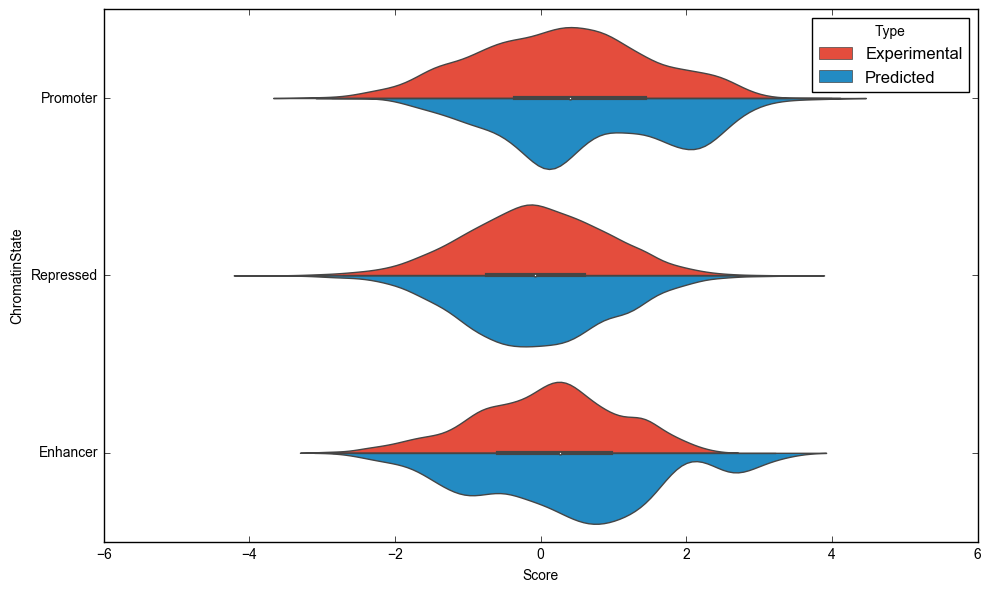

In [62]:
import matplotlib.pyplot as plt
import seaborn as sns

cols = {'Experimental': '#E44D3D',
        'Predicted': '#238BC3'}

plt.figure(figsize = (10, 6), dpi = 300)

ax = sns.violinplot(y="ChromatinState", 
                    x="Score",
#                     orient = 'h',
                    orient = 'h',
                    hue="Type",
                    data=df,
                    scale='count',
#                     fliersize=0,
                    saturation=1,
#                     linewidth=4,
                    width=0.8,
                    palette=cols,
#                     cut=0,
                    split=True,
                    inner='box',
                    dodge=False,
                    bw=0.2
                   );

# sns.despine(offset=5, trim=True);
# plt.legend(bbox_to_anchor=(0.9, 1.05),
#            bbox_transform=plt.gcf().transFigure);

plt.tight_layout()
plt.show()

# Nucleotide Interpretation of Top Sharpr Datapoints

Performing some initial per-base scoring of the top datapoints in the Sharpr dataset. Comparing deepLIFT w/ dinuc shuffled reference, deepLIFT w/ background ACGT content reference, grad\*input with background ACGT reference, guided backprop with background ACGT reference, and some in silico mutagenesis.

For putative "biologically relevant" sequence grammars, Avanti suggests looking at union of stuff found using deepLIFT w/ dinuc shuffled ref and guidedbackprop; validate these features w/ ISM.

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
import avutils
from avutils import file_processing as fp
import numpy as np
from collections import OrderedDict
from deeplift.blobs import NonlinearMxtsMode, DenseMxtsMode
import deeplift
reload(deeplift)
import deeplift.conversion.keras_conversion as kc
from deeplift.visualization import viz_sequence
reload(deeplift.visualization)

/home/users/rmovva/anaconda2/envs/mommadragonn/lib/python2.7/site-packages/theano/gpuarray/dnn.py:135: UserWarning: Your cuDNN version is more recent than Theano. If you encounter problems, try updating Theano or downgrading cuDNN to version 5.1.
  warnings.warn("Your cuDNN version is more recent than "
Using cuDNN version 6020 on context None
Mapped name None to device cuda: Tesla P100-PCIE-16GB (0000:04:00.0)


<module 'deeplift.visualization' from '/home/users/rmovva/git/deeplift/deeplift/visualization/__init__.pyc'>

In [2]:
modelName = "record_13_model_bgGhy_"
modelJson = "../model_files/sharpr_znormed_jul23/" + modelName + "modelJson.json"
modelWeights = "../model_files/sharpr_znormed_jul23/" + modelName + "modelWeights.h5"

keras_model = kc.load_keras_model(modelWeights, json=modelJson)

Using Theano backend.


In [3]:
# normalize weights
W, b = keras_model.layers[0].get_weights()
# print W.shape
mean_W = np.mean(W, axis = -2)
W = W - mean_W[:, :, None, :]
# # print W[:, :, :, 0]
# # print b.shape
b = b + np.squeeze(np.sum(mean_W,axis=0))
keras_model.layers[0].set_weights([W, b])

In [4]:
import momma_dragonn
# load the validation set
valid_path = "../hdf5files/sharpr_znormed_jul23/valid_data.hdf5"
data = (momma_dragonn.data_loaders.hdf5_data_loader
              .MultimodalAtOnceDataLoader(path_to_hdf5=valid_path,
                                          strip_enclosing_dictionary=True)
              .get_data())

Input modes [u'sequence']
Output modes [u'output']


In [6]:
deeplift_model = kc.convert_sequential_model(keras_model,
                                             nonlinear_mxts_mode=deeplift.blobs.NonlinearMxtsMode.DeepLIFT_GenomicsDefault)

deeplift_prediction_function = deeplift_model.get_prediction_function(input_layer_idx = 0,
                                                                      output_layer_idx = -1
                                                                     )

preds = deeplift_prediction_function([data.X], batch_size = 500)

deeplift_scoring_func = deeplift_model.get_target_contribs_func(find_scores_layer_idx = 0,
                                                                target_layer_idx = -1
                                                               )

gradient_input_model = kc.convert_sequential_model(keras_model,
                                                   nonlinear_mxts_mode = deeplift.blobs.NonlinearMxtsMode.Gradient)

gradient_input_func = gradient_input_model.get_target_contribs_func(find_scores_layer_idx=0, 
                                                                    target_layer_idx=-1
                                                                   )

guided_backprop_model = kc.convert_sequential_model(keras_model,
                                                    nonlinear_mxts_mode = deeplift.blobs.NonlinearMxtsMode.GuidedBackprop)

guided_backprop_func = guided_backprop_model.get_target_contribs_func(find_scores_layer_idx=0, 
                                                                      target_layer_idx=-1
                                                                     )

nonlinear_mxts_mode is set to: DeepLIFT_GenomicsDefault
For layer 1 the preceding linear layer is 0 of type Conv1D;
In accordance with nonlinear_mxts_mode=DeepLIFT_GenomicsDefault we are setting the NonlinearMxtsMode to Rescale
For layer 5 the preceding linear layer is 4 of type Conv1D;
In accordance with nonlinear_mxts_mode=DeepLIFT_GenomicsDefault we are setting the NonlinearMxtsMode to Rescale
For layer 10 the preceding linear layer is 8 of type Conv1D;
In accordance with nonlinear_mxts_mode=DeepLIFT_GenomicsDefault we are setting the NonlinearMxtsMode to Rescale
nonlinear_mxts_mode is set to: Gradient
nonlinear_mxts_mode is set to: GuidedBackprop


In [7]:
preds = np.array(preds)
print preds.shape
print data.Y.shape

# Sanity check correlations
from scipy.stats import spearmanr
for i in range(preds.shape[1]):
    print "Task %d Spearman: %.3f" % (i+1, spearmanr(preds[:, i], data.Y[:, i])[0])

(19833, 12)
(19833, 12)
Task 1 Spearman: 0.242
Task 2 Spearman: 0.303
Task 3 Spearman: 0.316
Task 4 Spearman: 0.115
Task 5 Spearman: 0.098
Task 6 Spearman: 0.123
Task 7 Spearman: 0.210
Task 8 Spearman: 0.163
Task 9 Spearman: 0.208
Task 10 Spearman: 0.171
Task 11 Spearman: 0.163
Task 12 Spearman: 0.183


In [8]:
import time
import h5py

def get_background_frequencies(filepath):
    try:
        f = h5py.File(filepath)
    except:
        sys.exit("Either there is no file called " + filepath + ", or it's not an HDF5 file.")
    
    sample = len(f['X']['sequence'])
#     sample = 5000
    indices = np.random.choice(np.arange(len(f['X']['sequence'])), sample, replace = False)
    
    sequences = np.take(np.array(f['X']['sequence']), indices, axis=0)
    print sequences.shape
    
    i=0
    t0 = time.time()
    baseCounts = [0, 0, 0, 0]
    for seq in sequences:
        if i % 5000 == 0 and i > 0:
            print("Computing sequences %d to %d took %.3f s" % (i-5000, i, time.time() - t0))
            t0 = time.time()
        for base in seq:
            baseCounts[np.argmax(base)] += 1
        i += 1
    
    return np.array(baseCounts) / float(np.sum(baseCounts))

# backgroundFrequencies = np.array([0.2905, 0.205, 0.2075, 0.297])
backgroundFrequencies = get_background_frequencies('../hdf5files/sharpr_znormed_jul23/valid_data.hdf5')
print backgroundFrequencies
print data.X.shape
referenceBackground = np.ones_like(data.X)*backgroundFrequencies[None,None,:]
print referenceBackground.shape

(19833, 145, 4)
Computing sequences 0 to 5000 took 0.905 s
Computing sequences 5000 to 10000 took 0.814 s
Computing sequences 10000 to 15000 took 0.817 s
[ 0.25924017  0.23967125  0.24462955  0.25645902]
(19833, 145, 4)
(19833, 145, 4)


In [9]:
import sys

letter_list = ['A', 'C', 'G', 'T']

def convert_one_hot_seq_to_acgt(one_hot_seq):
    seq = ''
    for i in range(len(one_hot_seq)):
        seq += letter_list[np.argmax(one_hot_seq[i])]
    return seq

import time
t0 = time.time()
input_data_sequences = []
print_interval = int(1e4)
for (i, seq) in enumerate(data.X):
    if i % print_interval == 0 and i > 0:
        print ("Converting sequences " + str(i - print_interval) +
               " to " + str(i) + " from one-hot to ACGT strings took " +
               str(round(time.time() - t0, 3)) + "s.")
        t0 = time.time()
    char_seq = convert_one_hot_seq_to_acgt(seq)
    input_data_sequences.append(char_seq)
    
input_data_sequences = np.array(input_data_sequences)

Converting sequences 0 to 10000 from one-hot to ACGT strings took 1.767s.


In [10]:
import avutils
from deeplift.dinuc_shuffle import dinuc_shuffle

seed = 0
deeplift_many_refs_func = deeplift.util.get_shuffle_seq_ref_function(
                                score_computation_function=deeplift_scoring_func, #supply any deeplift scoring function
                                shuffle_func=deeplift.dinuc_shuffle.dinuc_shuffle,
                                seed=seed,
                                one_hot_func=lambda x: np.array([avutils.util.seq_to_one_hot(seq) for seq in x]) #theano_seq_to_2d_image, seq_to_one_hot
                            )

In [11]:
task_idxs = [2, 5, 8, 11] # 'average' tasks for k5minp, k5sv40, hepminp, hepsv40 respectively

task_to_deeplift_multipliers = OrderedDict()
task_to_deepliftgcref_multipliers = OrderedDict()
task_to_gradinput_multipliers = OrderedDict()
task_to_guidedbackprop_multipliers = OrderedDict()
for task_idx in task_idxs:
    task_to_deeplift_multipliers[task_idx] = np.array(deeplift_many_refs_func(
                                                      task_idx = task_idx,
                                                      input_data_sequences=input_data_sequences,
                                                      num_refs_per_seq=8,
                                                      batch_size=500,
                                                      progress_update=100000))
    task_to_deepliftgcref_multipliers[task_idx] = np.array(deeplift_scoring_func(
                                                       task_idx = task_idx,
                                                       input_data_list=[data.X],
                                                       batch_size=500,
                                                       progress_update = 10000,
                                                       input_references_list = referenceBackground))
    task_to_gradinput_multipliers[task_idx] = np.array(gradient_input_func(
                                                       task_idx = task_idx,
                                                       input_data_list=[data.X],
                                                       batch_size=500,
                                                       progress_update = 10000,
                                                       input_references_list = referenceBackground))
    task_to_guidedbackprop_multipliers[task_idx] = np.array(guided_backprop_func(
                                                            task_idx = task_idx,
                                                            input_data_list=[data.X],
                                                            batch_size=500,
                                                            progress_update = 10000,
                                                            input_references_list = referenceBackground))

100000 reference seqs generated
One hot encoding sequences...
One hot encoding done...
Done 0
Done 100000
Done 0
Done 10000
Done 0
Done 10000
Done 0
Done 10000
100000 reference seqs generated
One hot encoding sequences...
One hot encoding done...
Done 0
Done 100000
Done 0
Done 10000
Done 0
Done 10000
Done 0
Done 10000
100000 reference seqs generated
One hot encoding sequences...
One hot encoding done...
Done 0
Done 100000
Done 0
Done 10000
Done 0
Done 10000
Done 0
Done 10000
100000 reference seqs generated
One hot encoding sequences...
One hot encoding done...
Done 0
Done 100000
Done 0
Done 10000
Done 0
Done 10000
Done 0
Done 10000


In [12]:
task_to_deeplift_summedscores = OrderedDict()
task_to_deepliftgcref_summedscores = OrderedDict()
task_to_gradinput_summedscores = OrderedDict()
task_to_guidedbackprop_summedscores = OrderedDict()
for task_idx in task_idxs:
    summed_scores = np.sum(task_to_deeplift_multipliers[task_idx], axis=2)
    task_to_deeplift_summedscores[task_idx] = np.expand_dims(summed_scores, axis=2)*data.X
    summed_scores = np.sum(task_to_deepliftgcref_multipliers[task_idx], axis=2)
    task_to_deepliftgcref_summedscores[task_idx] = np.expand_dims(summed_scores, axis=2)*data.X
    summed_scores = np.sum(task_to_gradinput_multipliers[task_idx], axis=2)
    task_to_gradinput_summedscores[task_idx] = np.expand_dims(summed_scores, axis=2)*data.X
    summed_scores = np.sum(task_to_guidedbackprop_multipliers[task_idx], axis=2)
    task_to_guidedbackprop_summedscores[task_idx] = np.expand_dims(summed_scores, axis=2)*data.X

In [13]:
print data.X[0][50]
print task_to_deeplift_multipliers[2][0][50]
print task_to_deeplift_summedscores[2][0][50]
print task_to_deepliftgcref_multipliers[2][0][50]
print task_to_deepliftgcref_summedscores[2][0][50]
print task_to_gradinput_multipliers[2][0][50]
print task_to_gradinput_summedscores[2][0][50]
print task_to_guidedbackprop_multipliers[2][0][50]
print task_to_guidedbackprop_summedscores[2][0][50]

[ 0.  0.  0.  1.]
[ 0.00312962 -0.00089471  0.00229781 -0.01012947]
[-0.         -0.         -0.         -0.00559675]
[-0.00049367 -0.00377402 -0.00575501 -0.0306163 ]
[-0.         -0.         -0.         -0.04063901]
[-0.00801723 -0.0052255   0.00652689 -0.01936772]
[-0.         -0.         -0.         -0.02608356]
[ 0.00050011 -0.00031305  0.00148618  0.00498037]
[ 0.          0.          0.          0.00665361]


In [66]:
from scipy.stats import spearmanr
print("Spearman(deepLIFT, grad*input): " + 
      str(spearmanr(np.ravel(np.sum(task_to_deeplift_multipliers[2], axis=2)), 
                    np.ravel(np.sum(task_to_gradinput_multipliers[2], axis=2))))
      )
print("Spearman(deepLIFT, deepLIFT_GCref): " + 
      str(spearmanr(np.ravel(np.sum(task_to_deeplift_multipliers[2], axis=2)), 
                    np.ravel(np.sum(task_to_deepliftgcref_multipliers[2], axis=2))))
      )
print("Spearman(grad*input, guidedbackprop): " + 
      str(spearmanr(np.ravel(np.sum(task_to_gradinput_multipliers[2], axis=2)), 
                    np.ravel(np.sum(task_to_guidedbackprop_multipliers[2], axis=2))))
      )
print("Spearman(deepLIFT, guidedbackprop): " + 
      str(spearmanr(np.ravel(np.sum(task_to_deeplift_multipliers[2], axis=2)), 
                    np.ravel(np.sum(task_to_guidedbackprop_multipliers[2], axis=2))))
      )

print "Mean deepLIFT %.3f" % np.mean(np.ravel(np.sum(task_to_deeplift_multipliers[2], axis=2)))
print "StdDev deepLIFT %.3f" % np.std(np.ravel(np.sum(task_to_deeplift_multipliers[2], axis=2)))
print "Mean deepLIFT GCref %.3f" % np.mean(np.ravel(np.sum(task_to_deepliftgcref_multipliers[2], axis=2)))
print "StdDev deepLIFT GCref %.3f" % np.std(np.ravel(np.sum(task_to_deepliftgcref_multipliers[2], axis=2)))
print "Mean grad*input %.3f" % np.mean(np.ravel(np.sum(task_to_gradinput_multipliers[2], axis=2)))
print "StdDev grad*input %.3f" % np.std(np.ravel(np.sum(task_to_gradinput_multipliers[2], axis=2)))
print "Mean guided backprop %.3f" % np.mean(np.ravel(np.sum(task_to_guidedbackprop_multipliers[2], axis=2)))
print "StdDev guided backprop %.3f" % np.std(np.ravel(np.sum(task_to_guidedbackprop_multipliers[2], axis=2)))

Spearman(deepLIFT, grad*input): SpearmanrResult(correlation=0.4142670828078136, pvalue=0.0)
Spearman(deepLIFT, deepLIFT_GCref): SpearmanrResult(correlation=0.5524443096796583, pvalue=0.0)
Spearman(grad*input, guidedbackprop): SpearmanrResult(correlation=-0.0025691321361303683, pvalue=1.3199255869109703e-05)
Spearman(deepLIFT, guidedbackprop): SpearmanrResult(correlation=0.11349459257734651, pvalue=0.0)
Mean deepLIFT 0.001
StdDev deepLIFT 0.012
Mean deepLIFT GCref -0.036
StdDev deepLIFT GCref 0.017
Mean grad*input -0.035
StdDev grad*input 0.037
Mean guided backprop 0.031
StdDev guided backprop 0.053


In [14]:
import gzip

valFragmentNames = [s.strip() for s in gzip.open('../splits/sharpr_znormed_jul23/val_split.txt.gz').readlines()]

[17179, 7923, 3403, 78, 3244, 14749, 7408, 11441, 12721, 6914, 3204, 3079, 5824, 18258, 8440, 14632, 12546, 10371, 13955, 17218, 7746, 18046, 418, 3165, 12607, 13643, 12207, 18316, 18652, 9026, 14005, 9158, 14478, 5478, 13907, 17380, 6788, 8231, 17631]
Sequence: Huvec_1_146_12_chr8_37620075_n
Start coordinate: 37619988
True value: 3.028
Predicted value: 1.704


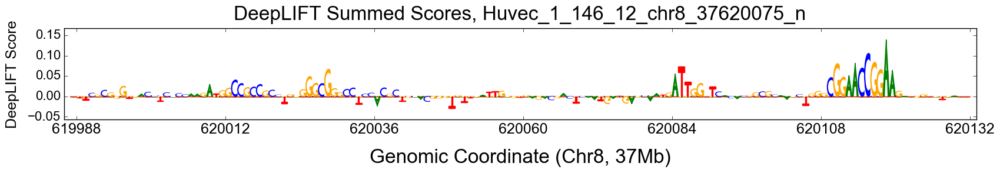

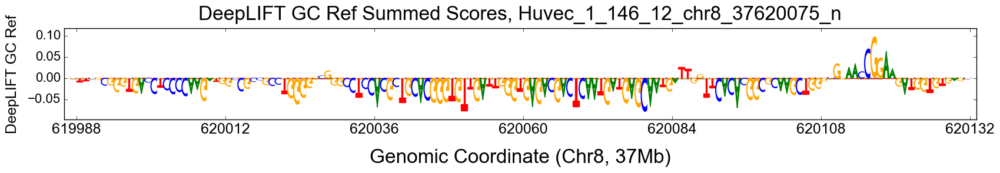

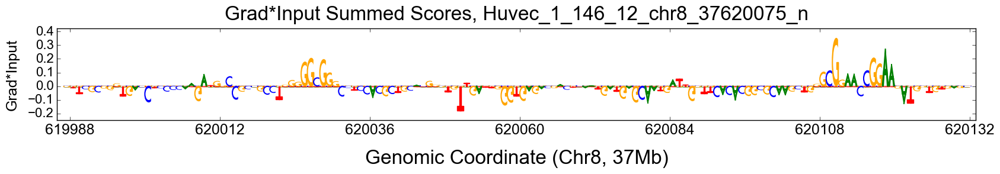

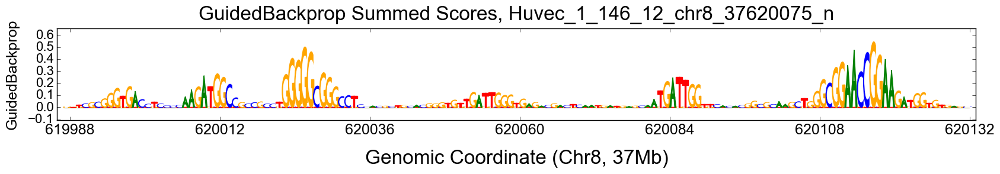

Sequence: Huvec_5_4_21_chr8_12934055_n
Start coordinate: 12934013
True value: 2.951
Predicted value: 1.628


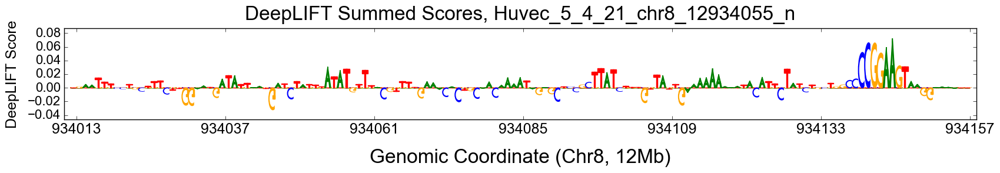

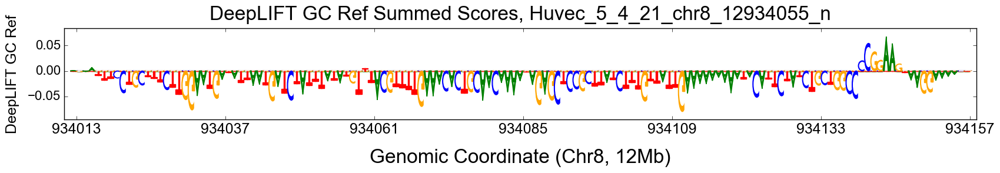

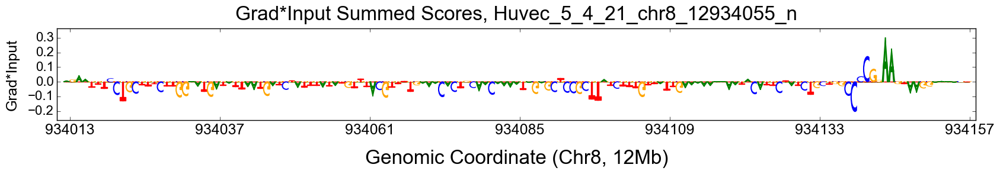

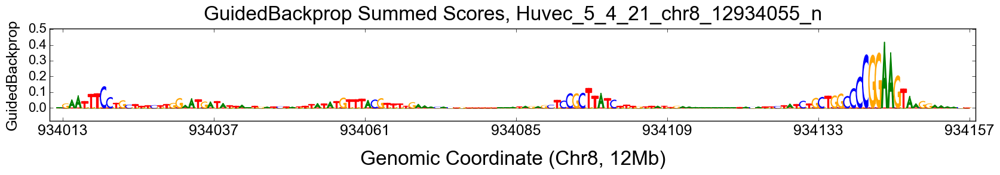

Sequence: Hepg2_4_76_24_chr8_54793555_n
Start coordinate: 54793528
True value: 2.550
Predicted value: 1.496


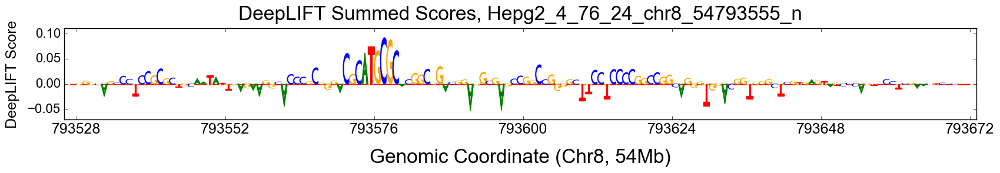

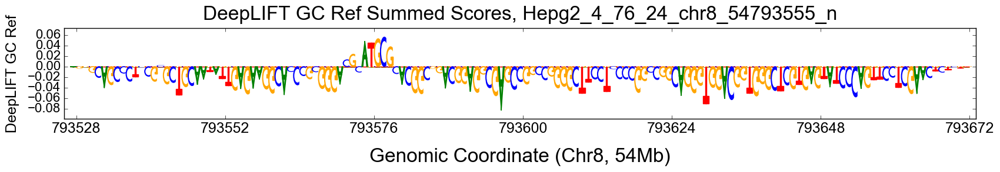

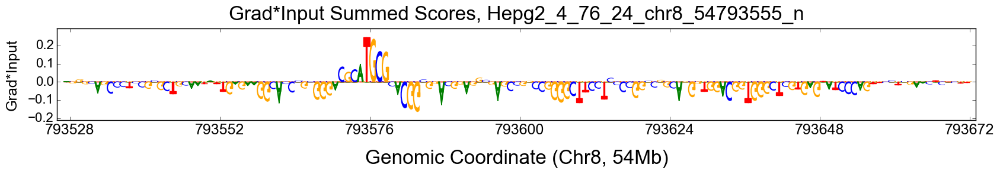

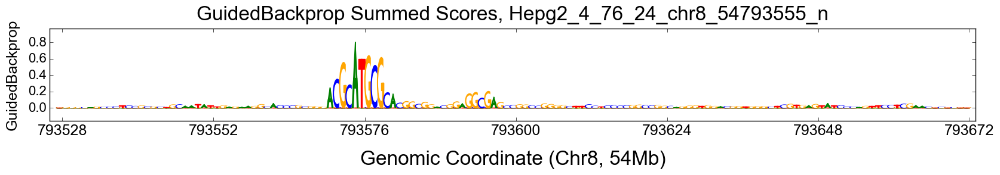

Sequence: H1hesc_1_53_16_chr8_37887995_n
Start coordinate: 37887928
True value: 2.534
Predicted value: 1.508


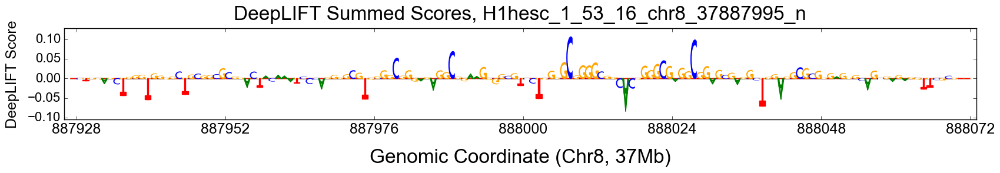

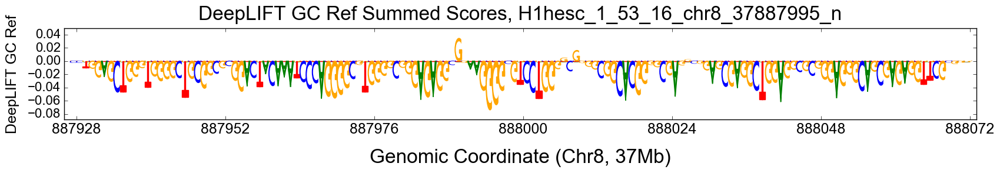

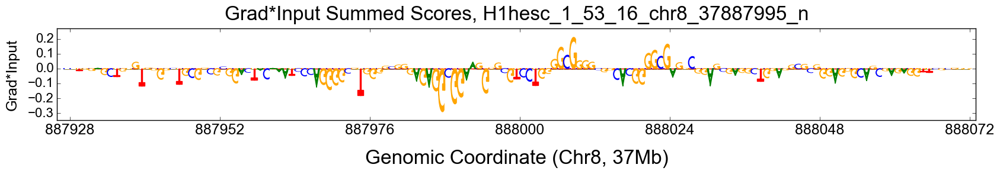

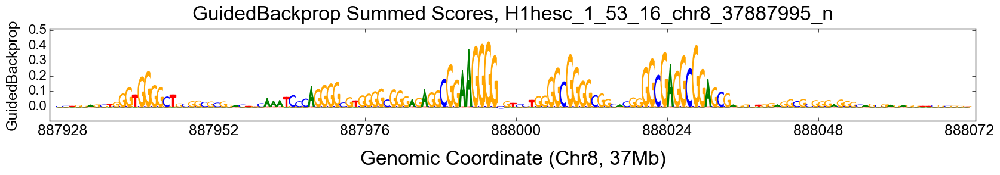

Sequence: Hepg2_1_79_20_chr8_125384955_n
Start coordinate: 125384908
True value: 2.455
Predicted value: 1.484


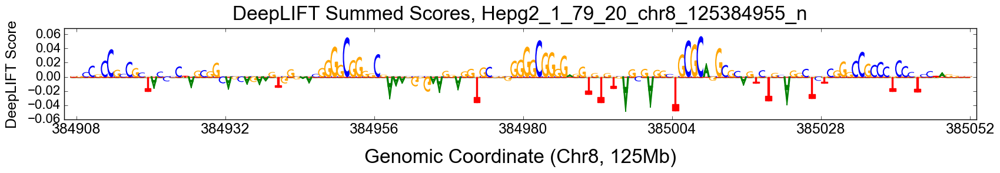

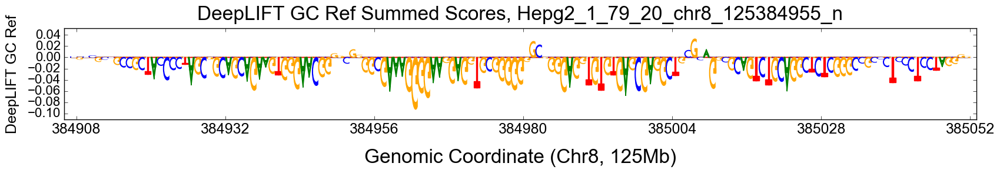

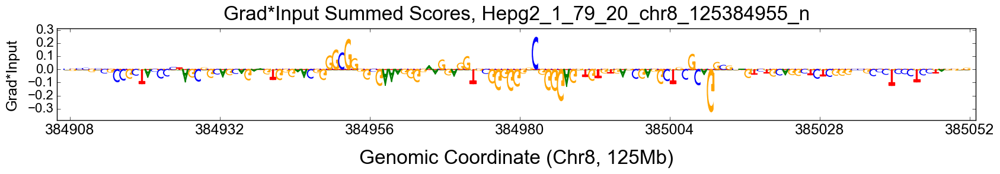

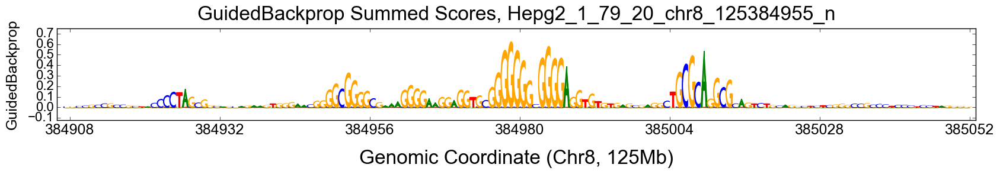

In [90]:
reload(deeplift.visualization)
from deeplift.visualization import viz_sequence

task_idx = 2
ordered_idxs = np.argsort(data.Y[:, task_idx])[::-1]
pred_margin = 0.45 # maximum fraction that the prediction can differ by

num_test = 1000
idxs_to_check = []
checked_regions = []
for i in range(num_test):
    y_true_idx = data.Y[ordered_idxs[i]][task_idx]
    y_pred_idx = preds[ordered_idxs[i]][task_idx]
#     print y_true_idx
#     print y_pred_idx
    if abs(y_pred_idx - y_true_idx) > pred_margin * y_true_idx:
        continue
    else:
        name = valFragmentNames[ordered_idxs[i]]
        cell = name.split('_')[0]
        region = '_'.join(name.split('_')[:3])
#         if cell == 'K562':
        if True:
            if region not in checked_regions:
                idxs_to_check.append(ordered_idxs[i])
                checked_regions.append(region)
        
print(idxs_to_check)

idxs_to_check = idxs_to_check[:5]

# np.random.shuffle(idxs_to_check)
        
for idx in idxs_to_check:
    name = valFragmentNames[idx]
    print("Sequence: %s" % name)
    start_coord = int(name.split('_')[-2]) - 147 + int(name.split('_')[3])*5
    print "Start coordinate: %d" % start_coord
    print("True value: %.3f" % data.Y[idx][task_idx])
    print("Predicted value: %.3f" % preds[idx][task_idx])
    mb = start_coord / 1000000
    start_coord %= 1000000
#     viz_sequence.plot_weights(task_to_deeplift_multipliers[task_idx][idx],
#                               tickcount = 6,
#                               figsize = (20, 2),
#                               xlabel = 'Genomic Coordinate (Chr8, %dMb)' % mb,
#                               start_coord = start_coord,
#                               xtickfontsize = 18,
#                               title = 'DeepLIFT Multipliers, %s' % name
#                              )
    viz_sequence.plot_weights(task_to_deeplift_summedscores[task_idx][idx],
                              tickcount = 6,
                              figsize = (20, 2),
                              xlabel = 'Genomic Coordinate (Chr8, %dMb)' % mb,
                              start_coord = start_coord,
                              xtickfontsize = 18,
                              title = 'DeepLIFT Summed Scores, %s' % name
                             )
    viz_sequence.plot_weights(task_to_deepliftgcref_summedscores[task_idx][idx],
                              tickcount = 6,
                              figsize = (20, 2),
                              xlabel = 'Genomic Coordinate (Chr8, %dMb)' % mb,
                              ylabel = 'DeepLIFT GC Ref',
                              start_coord = start_coord,
                              xtickfontsize = 18,
                              title = 'DeepLIFT GC Ref Summed Scores, %s' % name
                             )
    viz_sequence.plot_weights(task_to_gradinput_summedscores[task_idx][idx],
                              tickcount = 6,
                              figsize = (20, 2),
                              xlabel = 'Genomic Coordinate (Chr8, %dMb)' % mb,
                              ylabel = 'Grad*Input',
                              start_coord = start_coord,
                              xtickfontsize = 18,
                              title = 'Grad*Input Summed Scores, %s' % name
                             )
    viz_sequence.plot_weights(task_to_guidedbackprop_summedscores[task_idx][idx],
                              tickcount = 6,
                              figsize = (20, 2),
                              xlabel = 'Genomic Coordinate (Chr8, %dMb)' % mb,
                              ylabel = 'GuidedBackprop',
                              start_coord = start_coord,
                              xtickfontsize = 18,
                              title = 'GuidedBackprop Summed Scores, %s' % name
                             )

# In-silico mutagenesis

In [17]:
def ism(model, X, batch_size = 500):
    ref_preds = model.predict(X, batch_size = batch_size)
    ism_scores_by_base = np.ndarray(shape = X.shape, dtype = np.float32)
    for pos in range(X.shape[1]):
        for bp in range(X.shape[2]):
            X_mutated = X # start with original sequence
            X_mutated[:, pos] = np.zeros((X.shape[0], X.shape[2])) # set all bases at that pos to 0
            X_mutated[:, pos, bp] = 1 # set the correct base to 1 in the one-hot encoding
            ism_scores_by_base[:, pos, bp] = model.predict(X_mutated, batch_size = batch_size)
    return ism_scores_by_base

In [18]:
ism_idxs = [17179, 7923, 3403, 78, 3244]

# Sharpr grammar discovery - k-medoids + agglomerative clustering

General pipeline:

0. import criticalSubsetIdentification and other relevant modules
1. generate deepLIFT scores (contribs) as well as sequence tracks
2. get seqlets using csi.getSeqlets(params) -- this is with the fixed window method, can try null model in future
3. augment seqlet tracks with sequence\*multipliers
4. get distance matrix using cross correlation (csi.getCorrelationMatrix(params))
5. grammarClustering - using kmedoids + agglomerative clustering - w/ Peyton's code @ https://github.com/kundajelab/disease_projects/blob/master/deltaDeepLift/grammarClustering.py

Example function calls for getSeqlets and getCorrelationMatrix:

segmentIdentifier = csi.FixedWindowAroundPeaks(
                        slidingWindowForMaxSize=19 # Originally 20bp
                        , flankToExpandAroundPeakSize=0  #Originally 5 (3/16/16)
                        , excludePeaksWithinWindow=20
                        , ratioToTopPeakToInclude=0.5
                        , maxSegments=5);

seqlets, seqletIndices = csi.getSeqlets(rawDeepLIFTContribs=deeplift_score_array,
                                        indicesToGetSeqletsOn=range(deeplift_score_array.shape[0]),
                                        outputsBeforeActivation=None, #don't worry about this
                                        activation=None, #don't worry about this
                                        thresholdProb=1.0, #don't worry about this
                                        segmentIdentifier=segmentIdentifier,
                                        numThreads=1,
                                        secondsBetweenUpdates=1)
                                
seqletsCorrMat = csi.getCorrelationMatrix(
                                seqletsSubset
                                , subtracksToInclude=subtracksToInclude
                                # , subtrackNormaliseFunc=util.CROSSC_NORMFUNC.meanAndTwoNorm
                                , accountForRevComp=accountForRevComp
                                , numThreads=15
                                , secondsBetweenUpdates=3
                                , xcorBatchSize=xcorBatchSize #set this to something other than None to do xcor on GPU)

In [3]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
import avutils
from avutils import file_processing as fp
import numpy as np
from collections import OrderedDict
from deeplift.blobs import NonlinearMxtsMode, DenseMxtsMode
import deeplift
import deeplift.conversion.keras_conversion as kc
from deeplift.visualization import viz_sequence

import os, sys
from scipy.signal import correlate2d
import pandas as pd

sys.path.insert(0,"/home/users/rmovva/git/keras_1")
scriptsDir = os.environ.get("UTIL_SCRIPTS_DIR");
if (scriptsDir is None):
    raise Exception("Please set environment variable UTIL_SCRIPTS_DIR");
sys.path.insert(0,scriptsDir);

scriptsDir = os.environ.get("ENHANCER_SCRIPTS_DIR");
if (scriptsDir is None):
    raise Exception("Please set environment variable ENHANCER_SCRIPTS_DIR");
sys.path.insert(0,scriptsDir+"/featureSelector/deepLIFFT/");

sys.path.insert(0,scriptsDir+"/featureSelector/deepLIFFT/kerasBasedBackprop");

import criticalSubsetIdentification as csi

/home/users/rmovva/.local/lib/python2.7/site-packages/matplotlib/__init__.py:1357: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


In [4]:
modelName = "record_13_model_bgGhy_"
modelJson = "../model_files/sharpr_znormed_jul23/" + modelName + "modelJson.json"
modelWeights = "../model_files/sharpr_znormed_jul23/" + modelName + "modelWeights.h5"

keras_model = kc.load_keras_model(modelWeights, json=modelJson)

# normalize weights
W, b = keras_model.layers[0].get_weights()
mean_W = np.mean(W, axis = -2)
W = W - mean_W[:, :, None, :]
b = b + np.squeeze(np.sum(mean_W,axis=0))
keras_model.layers[0].set_weights([W, b])

import momma_dragonn
import h5py
# load the validation set
valid_path = "../hdf5files/sharpr_znormed_jul23/valid_data.hdf5"
data = h5py.File(valid_path)

deeplift_model = kc.convert_sequential_model(keras_model,
                                             nonlinear_mxts_mode=deeplift.blobs.NonlinearMxtsMode.DeepLIFT_GenomicsDefault)

deeplift_prediction_function = deeplift_model.get_prediction_function(input_layer_idx = 0,
                                                                      output_layer_idx = -1
                                                                     )

preds = deeplift_prediction_function([data['X/sequence']], batch_size = 500)

deeplift_scoring_func = deeplift_model.get_target_contribs_func(find_scores_layer_idx = 0,
                                                                target_layer_idx = -1
                                                               )

import sys

letter_list = ['A', 'C', 'G', 'T']

def convert_one_hot_seq_to_acgt(one_hot_seq):
    seq = ''
    for i in range(len(one_hot_seq)):
        seq += letter_list[np.argmax(one_hot_seq[i])]
    return seq

import time
t0 = time.time()
input_data_sequences = []
print_interval = int(1e4)
for (i, seq) in enumerate(np.array(data['X/sequence'])):
    if i % print_interval == 0 and i > 0:
        print ("Converting sequences " + str(i - print_interval) +
               " to " + str(i) + " from one-hot to ACGT strings took " +
               str(round(time.time() - t0, 3)) + "s.")
        t0 = time.time()
    char_seq = convert_one_hot_seq_to_acgt(seq)
    input_data_sequences.append(char_seq)
    
input_data_sequences = np.array(input_data_sequences)

import avutils
from deeplift.dinuc_shuffle import dinuc_shuffle

seed = 0
deeplift_many_refs_func = deeplift.util.get_shuffle_seq_ref_function(
                                score_computation_function=deeplift_scoring_func, #supply any deeplift scoring function
                                shuffle_func=deeplift.dinuc_shuffle.dinuc_shuffle,
                                seed=seed,
                                one_hot_func=lambda x: np.array([avutils.util.seq_to_one_hot(seq) for seq in x]) #theano_seq_to_2d_image, seq_to_one_hot
                            )

task_idxs = [2, 5, 8, 11] # 'average' tasks for k5minp, k5sv40, hepminp, hepsv40 respectively

task_to_deeplift_contribs = OrderedDict()
for task_idx in task_idxs:
    task_to_deeplift_contribs[task_idx] = np.array(deeplift_many_refs_func(
                                                      task_idx = task_idx,
                                                      input_data_sequences=input_data_sequences,
                                                      num_refs_per_seq=8,
                                                      batch_size=500,
                                                      progress_update=100000))

/home/users/rmovva/git/scikit-learn/sklearn/externals/joblib/_multiprocessing_helpers.py:28: UserWarning: [Errno 2] No such file or directory.  joblib will operate in serial mode
  warnings.warn('%s.  joblib will operate in serial mode' % (e,))


nonlinear_mxts_mode is set to: DeepLIFT_GenomicsDefault
For layer 1 the preceding linear layer is 0 of type Conv1D;
In accordance with nonlinear_mxts_mode=DeepLIFT_GenomicsDefault we are setting the NonlinearMxtsMode to Rescale
For layer 5 the preceding linear layer is 4 of type Conv1D;
In accordance with nonlinear_mxts_mode=DeepLIFT_GenomicsDefault we are setting the NonlinearMxtsMode to Rescale
For layer 10 the preceding linear layer is 8 of type Conv1D;
In accordance with nonlinear_mxts_mode=DeepLIFT_GenomicsDefault we are setting the NonlinearMxtsMode to Rescale
Converting sequences 0 to 10000 from one-hot to ACGT strings took 2.578s.
100000 reference seqs generated
One hot encoding sequences...
One hot encoding done...
Done 0
Done 100000
100000 reference seqs generated
One hot encoding sequences...
One hot encoding done...
Done 0
Done 100000
100000 reference seqs generated
One hot encoding sequences...
One hot encoding done...
Done 0
Done 100000
100000 reference seqs generated
One

In [5]:
contribs = task_to_deeplift_contribs[2]
print contribs.shape
summed_contribs_sequence = np.sum(contribs, axis=-1)[:,:,None]*data['X/sequence']
print summed_contribs_sequence.shape
sequence_contribs = contribs*data['X/sequence']
print sequence_contribs.shape
contribs = np.swapaxes(np.expand_dims(contribs, axis=1), 2, 3)
print contribs.shape

(19833, 145, 4)
(19833, 145, 4)
(19833, 145, 4)
(19833, 1, 4, 145)


In [6]:
print np.sum(np.abs(data['Y/output'][:, 2]) > 1)
print data['Y/output'][:, 2][np.abs(data['Y/output'][:, 2]) > 1]
seqlet_idxs = np.arange(contribs.shape[0])[np.abs(data['Y/output'][:, 2]) > 1]

6761
[-1.37259912 -1.10616851 -1.04501569 ...,  1.51955116 -1.03034878 -2.020509  ]


In [7]:
segmentIdentifier = csi.FixedWindowAroundPeaks(
                        slidingWindowForMaxSize=17,
                        flankToExpandAroundPeakSize=0,
                        excludePeaksWithinWindow=20,
                        ratioToTopPeakToInclude=0.5,
                        maxSegments=5)

seqlets, seqletIndices = csi.getSeqlets(
                                rawDeepLIFTContribs=contribs,
#                                 indicesToGetSeqletsOn=range(contribs.shape[0]),
                                indicesToGetSeqletsOn = seqlet_idxs, 
                                outputsBeforeActivation=None, #don't worry about this
                                activation=None, #don't worry about this
                                thresholdProb=1.0, #don't worry about this
                                segmentIdentifier=segmentIdentifier,
                                revCompFunc=csi.dnaRevCompFunc
#                                 numThreads=1,
#                                 secondsBetweenUpdates=1
                                )

print("Total seqlets:",len(seqlets))

Done 0 of 6761
Done 2000 of 6761
Done 5000 of 6761
Done 6000 of 6761
Done 10000 of 6761
Done 11000 of 6761
Done 13000 of 6761
('Total seqlets:', 13232)


In [8]:
# Augment tracks
# The sequence track is literally just the sequence of the seqlet
# The sequence contrib track is contribs*sequence -- that is, how much did the actual
# base pair present in the genomic sequence contribute to the prediction?
for (fullDataArr,
     name,
     pseudocount) in [
       (np.swapaxes(data['X/sequence'], 1, 2).astype("float"),
        "sequence",
        0.25 #pseudocount
        # Pseudocounts are useful when seqlets are merged
        # into a motif (later), but we don't want to be
        # overconfident in the frequency of bases at any
        # particular position. 0.25 means that each
        # 'pseudocount' at a particular position carries
        # a value of 0.25       
       ),
       (np.swapaxes(sequence_contribs, 1, 2), #data
        "sequence_contribs",
        0.0),
       (np.swapaxes(summed_contribs_sequence, 1, 2), #data
        "summed_contribs_sequence",
        0.0)]:
    csi.augmentSeqletsWithData(
        seqlets,
        fullDataArr=fullDataArr,
        keyName=name,
        pseudocount=pseudocount,
        revCompFunc=csi.dnaRevCompFunc
    )

('Seqlet with idx', 1961)
('Track:', 'sequence')


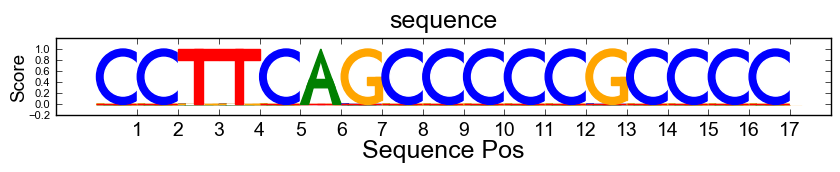

('Track:', 'sequence_contribs')


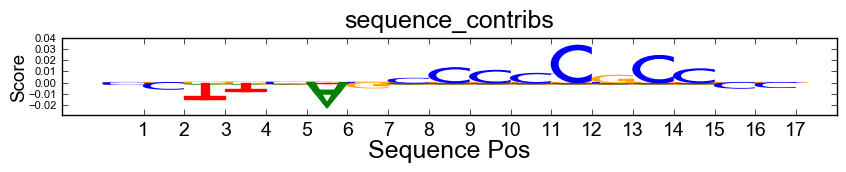

('Track:', 'summed_contribs_sequence')


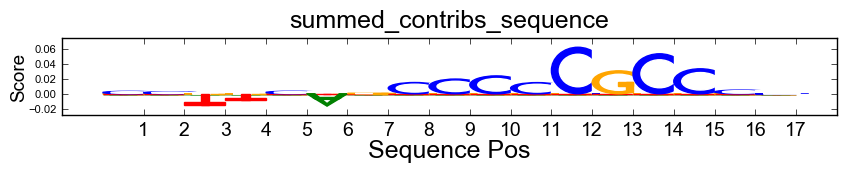

('Track:', 'coreDeepLIFTtrack')


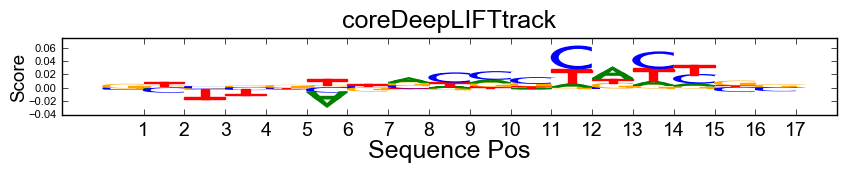

In [9]:
# Visually explore some seqlets as a sanity check
track_names_to_print=["sequence", "sequence_contribs", "summed_contribs_sequence", "coreDeepLIFTtrack"]
for idx in np.random.choice(range(len(seqlets)), 1, replace=False):
    print("Seqlet with idx",idx)
    for track_name in track_names_to_print:
        print("Track:",track_name)
        viz_sequence.plot_weights(seqlets[idx].getSummedDataTrack(track_name),
                                  figsize=(10,1),
                                  tickcount = 13,
                                  xlabel = 'Sequence Pos',
                                  ylabel = 'Score',
                                  start_coord = 1,
                                  xtickfontsize = 14,
                                  ytickfontsize = 8,
                                  title = '%s' % track_name,
                                  titlefontsize = 18,
                                  xaxisfontsize = 18,
                                  yaxisfontsize = 13.5,
                                  xaxispad = 0,
                                  yaxispad = 0
                                 )

In [10]:
sys.path.insert(0, '/home/users/rmovva/git/enhancer_prediction_code/featureSelector/deepLIFFT/')

seqletsCorrMat = csi.getCorrelationMatrix(
                                seqlets,
                                subtracksToInclude=['coreDeepLIFTtrack', 'summed_contribs_sequence'],
                                # , subtrackNormaliseFunc=util.CROSSC_NORMFUNC.meanAndTwoNorm
                                accountForRevComp=True,
#                                 numThreads=15,
#                                 secondsBetweenUpdates=3,
                                xcorBatchSize=100, # set this to something other than None to do xcor on GPU 
                                progress_update=5000
                                )

Num words: 13232 and 13232
('On filters', 0, 'to', 7352)
Done 0
Done 5000
Done 10000
('On filters', 7352, 'to', 14704)
Done 0
Done 5000
Done 10000
('On filters', 0, 'to', 7352)
Done 0
Done 5000
Done 10000
('On filters', 7352, 'to', 14704)
Done 0
Done 5000
Done 10000
Seconds to compute corr mat: 110.607355118


In [14]:
from grammarClustering import grammarDetection

kmedoids_agglom_grammars = grammarDetection(seqlets, 
                                            seqletsCorrMat, 
                                            flankSize=0, 
                                            grammarClusterMethod='kmedoids_w_agg',
                                            cc_threshold=0.75, 
                                            return_seqlet_indices=False, 
                                            trackNameToUse='summed_contribs_sequence',
                                            trim=True,
                                            n_init=5)

Initial cost: 12280.6082652
Random search cost: 12138.4402825
Random search cost: 12137.6573122
Random search cost: 12132.7845546
Random search cost: 12132.2371478
Random search cost: 12128.4639123
Random search cost: 12128.4291451
Random search cost: 12125.1369197
Random search cost: 12122.2751278
Random search cost: 12119.3183789
Random search cost: 12116.3030816
Random search cost: 12110.0740127
Random search cost: 12100.3761614
Random search cost: 12099.7523209
Random search cost: 12096.6521276
Random search cost: 12090.2492335
Random search cost: 12089.6303158
Random search cost: 12088.5330154
Random search cost: 12083.9948291
Random search cost: 12083.2714061
Random search cost: 12083.1522142
Random search cost: 12079.3163873
Random search cost: 12072.4217142
Random search cost: 12072.0793177
Random search cost: 12066.386882
Random search cost: 12057.7495068
Random search cost: 12056.2488445
Random search cost: 12054.3351731
Random search cost: 12046.3895081
Random search cost: 1

['minPseudocount', 'summedDataTracks', 'totalObservationsEver', 'revCompedNormalisedDataTracks', 'pseudocountMultiplier', 'numUnderlyingObservations', 'normalisedDataTracks', 'pseudocountFrac']
Plotting motifs...
('On motif', 0)


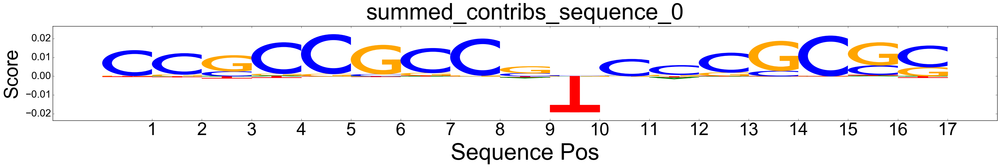

('On motif', 1)


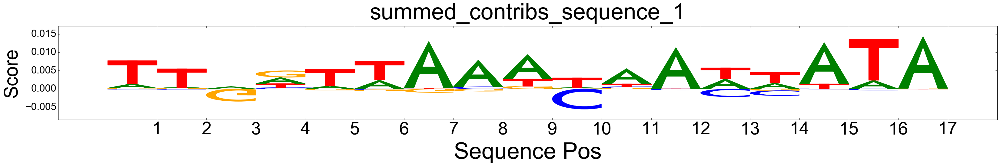

('On motif', 2)


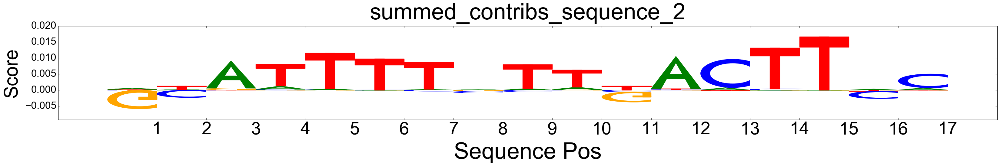

('On motif', 3)


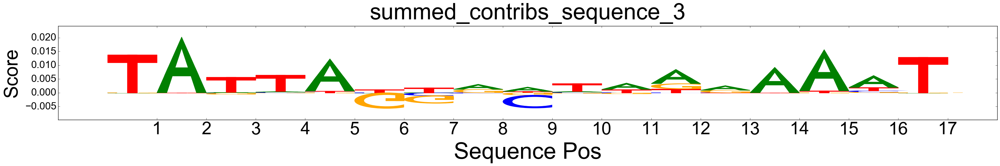

('On motif', 4)


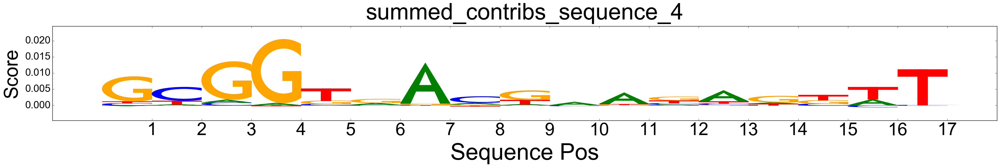

('On motif', 5)


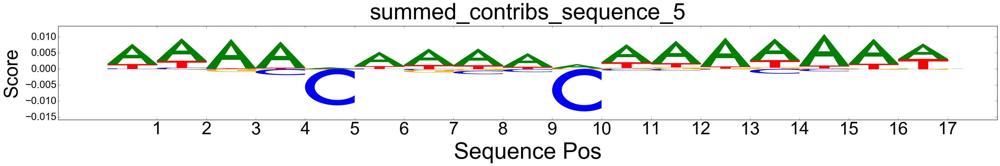

('On motif', 6)


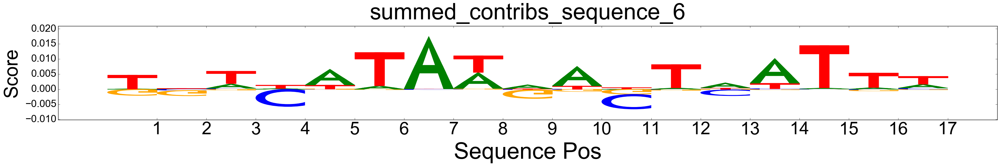

('On motif', 7)


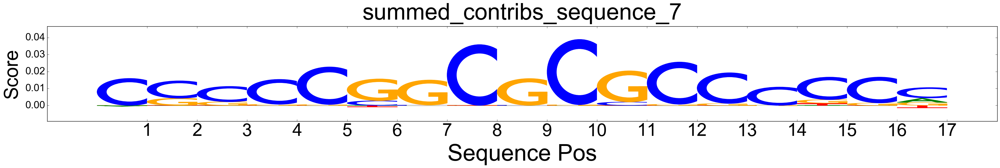

('On motif', 8)


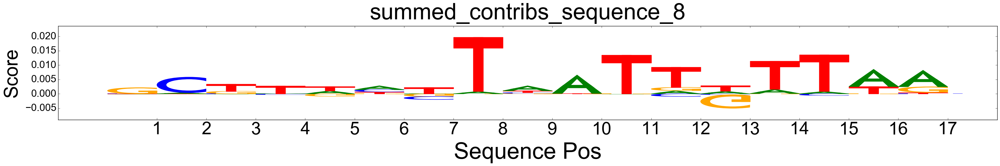

('On motif', 9)


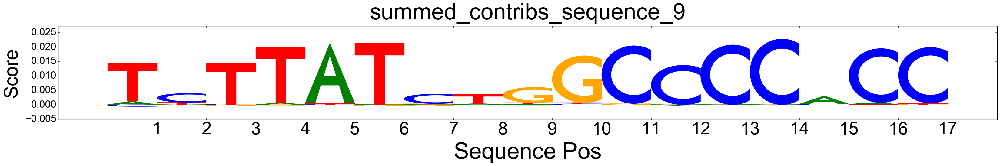

('On motif', 10)


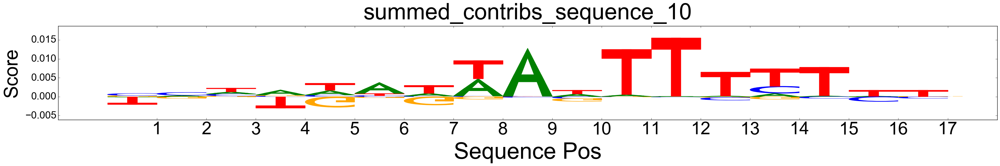

('On motif', 11)


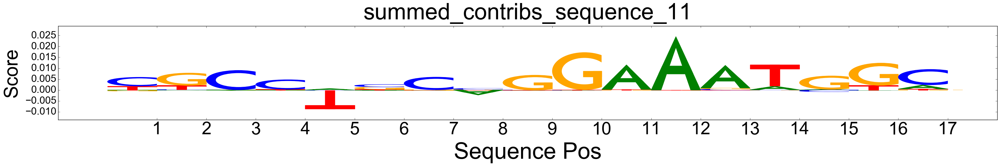

('On motif', 12)


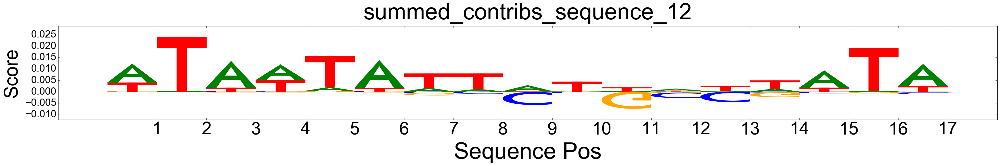

('On motif', 13)


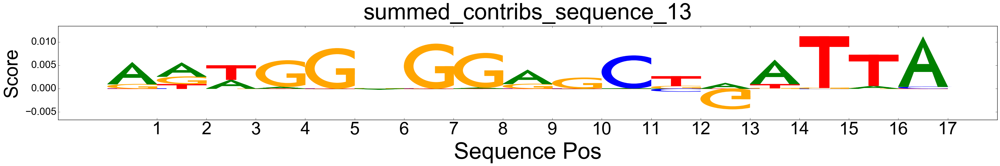

('On motif', 14)


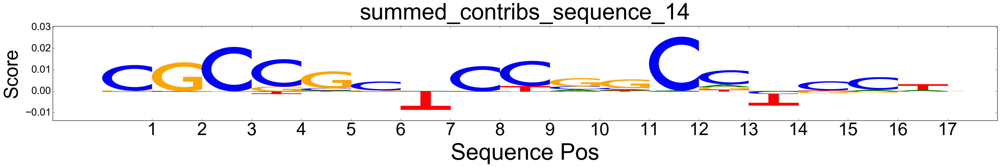

('On motif', 15)


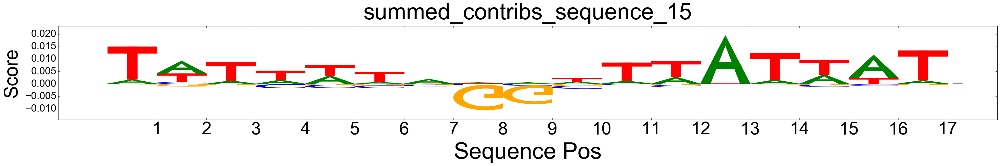

('On motif', 16)


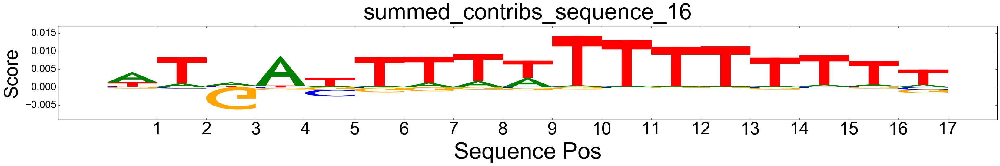

('On motif', 17)


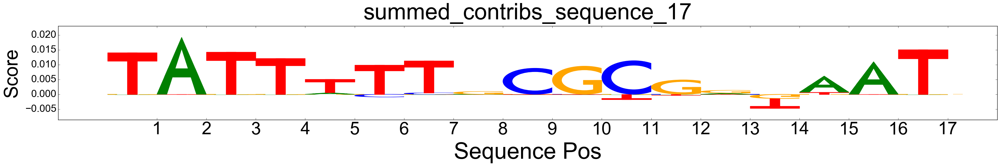

('On motif', 18)


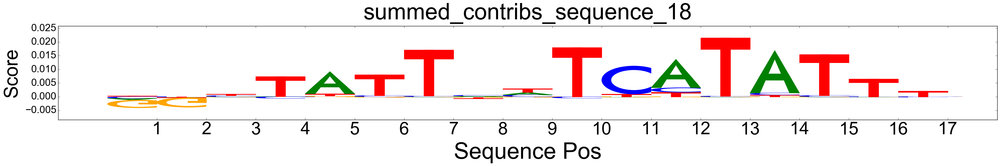

('On motif', 19)


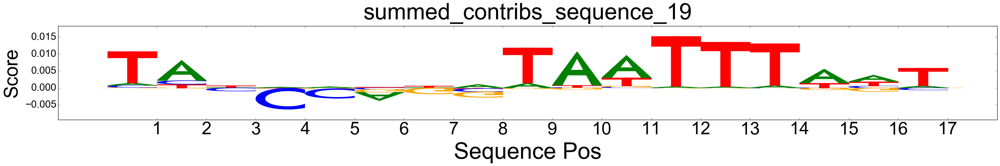

('On motif', 20)


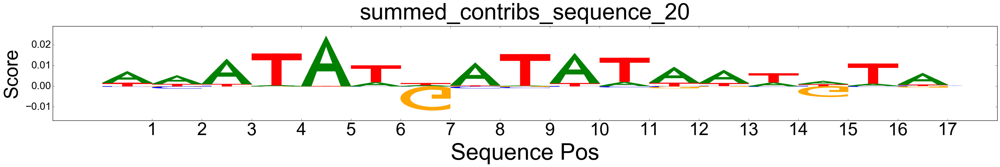

('On motif', 21)


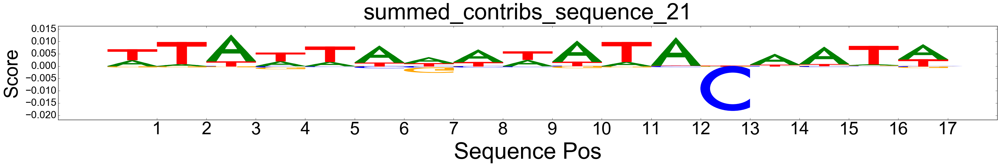

('On motif', 22)


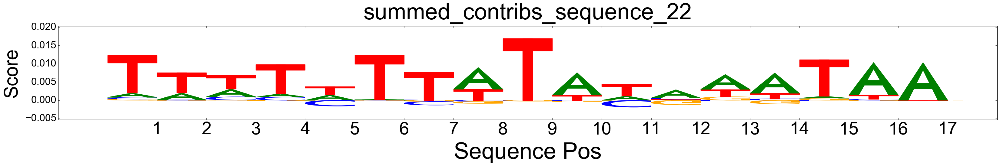

('On motif', 23)


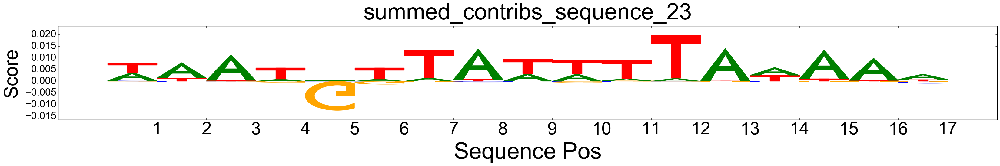

('On motif', 24)


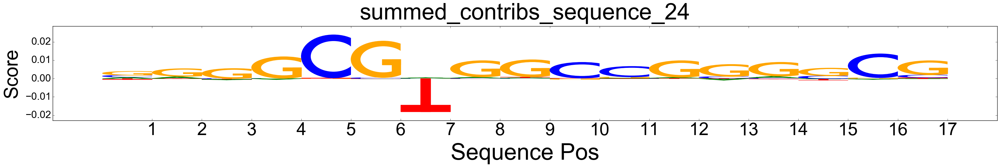

('On motif', 25)


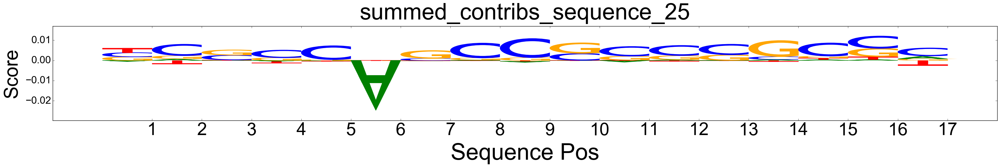

('On motif', 26)


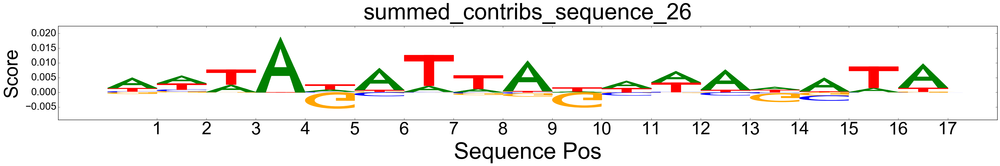

('On motif', 27)


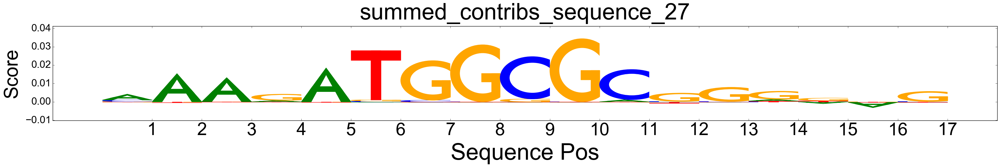

('On motif', 28)


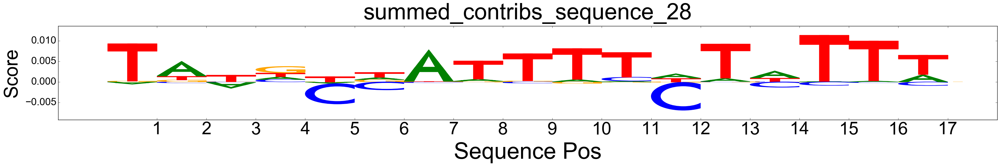

('On motif', 29)


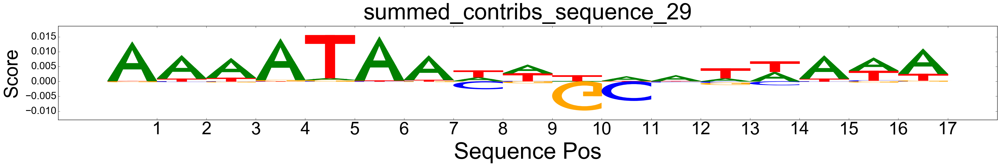

('On motif', 30)


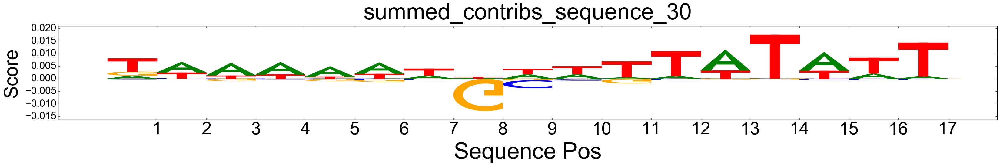

('On motif', 31)


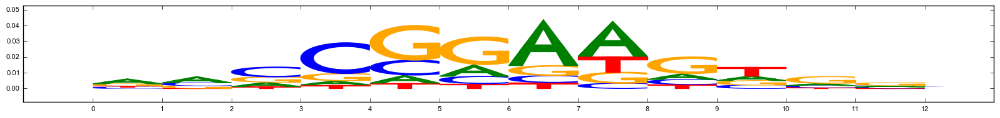

In [15]:
import sklearn.cluster
reload(deeplift.visualization.viz_sequence)
from deeplift.visualization import viz_sequence
import os

os.system("mkdir ../model_files/%s/interpretation/modisco/" % "sharpr_znormed_jul23")

n_cluster_list = [100]
for n_clusters in n_cluster_list:
    print "N_clusters = " + str(n_clusters)
    print "Running k-means..."
    kmeans_clusters = sklearn.cluster.KMeans(n_clusters=n_clusters, n_init=10).fit_predict(embedding_corr)
    print "Plotting k-means..."
    modisco_tutorial.scatter_plot(embedding_corr, 
                                  labels=kmeans_clusters, 
                                  save = True, 
                                  savepath = (("../model_files/%s/interpretation/" % "sharpr_znormed_jul23") +
                                              "tsne/tsne_kmeans_" + str(n_clusters) + "clusters.png"))
    
    print "Merging motifs..."
    merged_motifs = modisco_tutorial.create_merged_modisco_motifs(
                    kmeans_clusters, seqlets,
                    subtracks_to_align_on=["core_importance_track"],
                    account_for_rev_comp=True)
    
    trimming_func = modisco_tutorial.TrimArrayColumnsToNumUnderlyingObs(0.5)
    merged_motifs = modisco_tutorial.adjust_modisco_motifs_using_trimming_criterion(
                    merged_motifs,
                    trimming_func=trimming_func)
    
    dirName = (("../model_files/%s/interpretation/modisco/modisco_" % "sharpr_znormed_jul23") + 
              str(n_clusters) + "motifs/")
    if os.path.isdir(dirName) == False:
        os.mkdir(dirName)
    
    print "Plotting motifs..."
    for motif_idx, motif in enumerate(merged_motifs.values()):
        print("On motif",motif_idx)
        for track_name in ["summed_contribs", "core_importance_track"]:
            if n_clusters > 25:
                show = False
            else:
                show = True
                
            viz_sequence.plot_weights(
                motif.getNormalisedDataTrack(track_name),
                figsize=(20,2),
                show = show,
                save = True,
                savepath = (dirName + "motif_" + track_name + "_" + str(motif_idx) + ".png"),
                tickcount = 13,
                xlabel = 'Sequence Pos',
                ylabel = 'Score',
                start_coord = 1,
                xtickfontsize = 14,
                ytickfontsize = 8,
                title = '%s_%s' % (track_name, str(motif_idx)),
                titlefontsize = 18,
                xaxisfontsize = 18,
                yaxisfontsize = 13.5,
                xaxispad = 0,
                yaxispad = 0)